# Generative Image to Image Translation with CycleGAN  
[Parag K. Mital](https://pkmital.com)  
[Creative Applications of Deep Learning](https://www.kadenze.com/programs/creative-applications-of-deep-learning-with-tensorflow)  
[Kadenze, Inc.](https://kadenze.com)  

This content appears as part of the course, [Creative Applications of Deep Learning](https://www.kadenze.com/programs/creative-applications-of-deep-learning-with-tensorflow), as part of the [Kadenze Academy](https://kadenze.com) program.  This content is licensed under an [APL 2.0 License](https://github.com/pkmital/CycleGAN/blob/master/LICENSE).

In [0]:
!git clone https://github.com/pkmital/CycleGAN.git

Cloning into 'CycleGAN'...
remote: Enumerating objects: 48, done.
remote: Total 48 (delta 0), reused 0 (delta 0), pack-reused 48
Unpacking objects: 100% (48/48), done.


In [0]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!ls

CycleGAN  drive  sample_data


# Introduction

This colab introduces you to the following work:

(-0.5, 1773.5, 1345.5, -0.5)

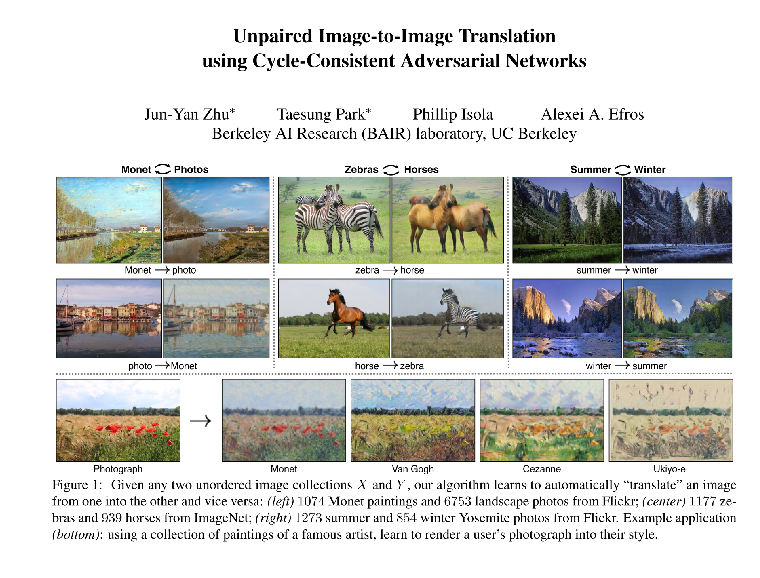

In [0]:
%matplotlib inline
import matplotlib
plt = matplotlib.pyplot
plt.figure(figsize=(20,10))
plt.imshow(plt.imread('CycleGAN/imgs/cycle-gan-paper.png'))
plt.axis('off')

Image to image translation covers a very wide set of applications in computer graphics, computer vision, and deep learning with image and video.  The basic idea is to translate an input image into an output image.  This is different to say autoencoding an image, where both the input and the output are exactly the same.  In this case, they are expected to be different sets of images.  For instance, the input image might be a landscape photo and the output could be an artistic stylization of that photo.  Or perhaps the input is a photo of a horse, and the output should be photos of zebras instead.  Let's say instead you have a maps showing the outlines of streets and highways, and you'd like to apply a texture to these images so that it looks like a satellite image instead.  Or maybe you want to recreate the Google AI Experiment where they convert sketches to pictures of cats.  Or perhaps you want to recreate the app FaceApp which adds smiles to people's faces.  These are all examples of image to image translation. 

One of the earliest demonstrations of this idea is in a paper in 2001 called Image Analogies.  Aaron Hertzmann and colleagues showed the basic idea of image to image translation by using analogous image pairs.  You would give an example analogy, such as an image of a street map, and the corresponding satellite image, and then you could give it any other street map image, and it would give you a new satellite image for it.

(-0.5, 1885.5, 803.5, -0.5)

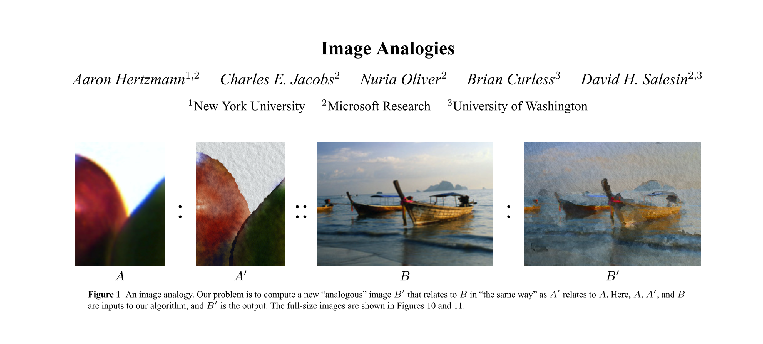

In [0]:
plt.figure(figsize=(13,10))
plt.imshow(plt.imread('CycleGAN/imgs/image-analogies-paper.png'))
plt.axis('off')

How could we build a neural network to do something similar?  Autoencoders and generative adversarial networks allow for some pretty impressive unsupervised modeling of image collections.  For instance, an autoencoder with an input different from the output could essentially learn to translate one image into another.  Let's say for instance if you had black and white images, and wanted to convert them to color images, you could create a dataset of either image, and then feed in pairs of each type of image to an autoencoder.  The resulting loss function would then take as output some color image, and input a black and white image, and the network would need to learn to essentially colorize the image.

Though if you've ever tried this, you might have found that autoencoders generally have a pretty big issue with images: their loss function generally uses a L2 or squared loss function, and this often results in really blurry reconstructions, or reconstructions that don't necessarily understand the content of the image beyond simple pixels.  

We then saw that the generative adversarial network did not have this issue since it learned its own loss function by training a separate network, a discriminator, to say whether an image was real or fake.   So could we build a generative adversarial network that could learn to colorize an image?  Or to convert street maps into satellite maps?  Or any other potential application of image to image translation?  This tutorial covers one of the state of the art techniques for image to image translation called CycleGAN.

# CycleGAN

CycleGAN builds on earlier work called Pix2Pix.  The Pix2Pix network requires paired translations, which means that while training, for each input, you need to specify exactly what the output should look like.  CycleGAN instead just requires two _unpaired_ collections of images and will do its best to find the mapping between them, without you having to specify what the pairs are.  It's a really impressive network and pretty simple to build.  We'll need many of the same components that we needed for the DCGAN and VAEGAN networks we built in Course 1 Session 5.

(-0.5, 879.5, 827.5, -0.5)

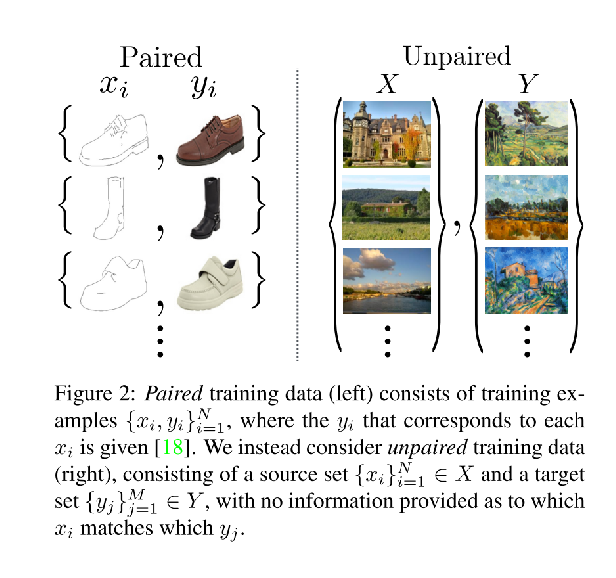

In [0]:
plt.figure(figsize=(13,10))
plt.imshow(plt.imread('CycleGAN/imgs/cycle-gan-figure-2.png'))
plt.axis('off')


We're going to need to build a set of operations that map one image collection to another, and build those operations for each image collection $X$ and $Y$.  We'll also have to build another set of operations so that there is a complete cycle of operations that attempt to map our first collection of images, $X$, to the second collection, $Y$, so a fake $Y$ which we denote mathematically by $\hat{Y}$, and then another generator to map both the real $Y$ and the fake $\hat{Y}$ back to $\hat{X}$ again. In the Figure below, we can sort of see how this works graphically with two collections, $X$ and $Y$:


(-0.5, 1793.5, 705.5, -0.5)

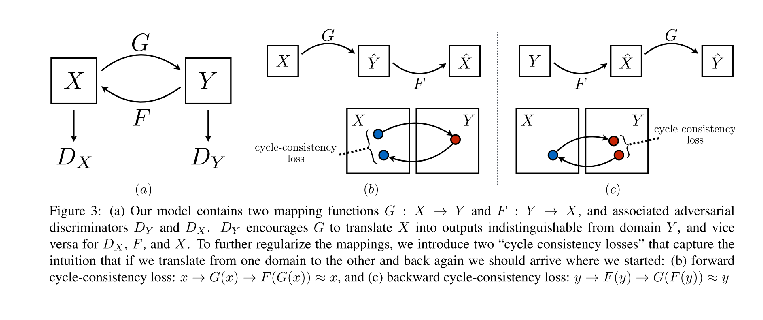

In [0]:
plt.figure(figsize=(13,10))
plt.imshow(plt.imread('CycleGAN/imgs/cycle-gan-figure-3.png'))
plt.axis('off')

# Quiz:

> How many generative networks are in the CycleGAN network?

> How many discriminators are in the CycleGAN network?

# Encoder

This network essentially trains 2 autoencoders using a set of 2 generators (`G` and `F` in the images above) and 2 discriminators (`D_X` and `D_Y` in the images above) .  The idea is pretty easy to grasp if you are already familiar with generative adversarial networks, and most of the tricky bits are in the details of implementation.

The Generator is slightly different though.  Instead of starting with a random feature vector of say 100 values, we'll actually start with an image and then compose something not unlike an Autoencoder.  The structure of this Autoencoder is a little different.  We'll have three major components: an encoder, transformer, and decoder. 

The encoder is composed of a few convolutional layers with stride 2 which will downsample the image with each layer.  The authors create it with 3 layers, and use padding on the first layer.

Let's see it written up as code.  First some imports.  We'll include TensorFlow as well as a contrib package which makes writing layers a lot easier, similar to Keras.  We'll also be using Instance Normalization (http://arxiv.org/abs/1607.08022) for our layer normalization and Leaky ReLus as the authors of CycleGAN have done.  I've included my implementation of CycleGAN and all utility functions in the `cycle_gan.py` module which you can also find as part of the `cadl` repo: https://github.com/pkmital/pycadl (easily pip installed by: `pip install cadl`):

In [0]:
!pip install cadl
import numpy as np
import os
import tensorflow as tf
import tensorflow.contrib.layers as tfl
from cadl.cycle_gan import lrelu, instance_norm

    100% |████████████████████████████████| 153kB 7.1MB/s 


Now let's write a function for the encoder, following the CycleGAN architecture.  We want a padding layer, then 3 convolutional layers with strides 1, then 2, then another 2.  The first convolutional layer will have a 7x7 convolution, and the rest will be 3x3.  Also, we'll initialize the weights to a standard deviation of 0.02 using a normal distribution.  For an activation function, we'll be using a Leaky ReLu with 0.2 leakage.  We'll also exponentially increase the number of filters with each layer, starting with 32, then going to 64 and finally 128.  Lastly, we'll also use something like batch normalization called instance normalization, and use the TensorFlow layers module to do the entire convolution operation for us in a single convenient function:

In [0]:
def encoder(x, n_filters=32, k_size=3, normalizer_fn=instance_norm,
        activation_fn=lrelu, scope=None, reuse=None):
    with tf.variable_scope(scope or 'encoder', reuse=reuse):
        h = tf.pad(x, [[0, 0], [k_size, k_size], [k_size, k_size], [0, 0]],
                "REFLECT")
        h = tfl.conv2d(
                inputs=h,
                num_outputs=n_filters,
                kernel_size=7,
                stride=1,
                padding='VALID',
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                normalizer_fn=normalizer_fn,
                activation_fn=activation_fn,
                scope='1',
                reuse=reuse)
        h = tfl.conv2d(
                inputs=h,
                num_outputs=n_filters * 2,
                kernel_size=k_size,
                stride=2,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                normalizer_fn=normalizer_fn,
                activation_fn=activation_fn,
                scope='2',
                reuse=reuse)
        h = tfl.conv2d(
                inputs=h,
                num_outputs=n_filters * 4,
                kernel_size=k_size,
                stride=2,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                normalizer_fn=normalizer_fn,
                activation_fn=activation_fn,
                scope='3',
                reuse=reuse)
    return h

We're also being explicit about our scope and reuse as we'll need to reuse these variables a few times which we'll see in a few moments.

# Residual Blocks and Transformer

The next part of the Generator is the Transformer.  These are going to be 6 or 9 Residual Blocks, which is a really powerful module that comes up a lot in almost every new architecture out there.  Instead of simply having a convolutional layer, we'll have a convolutional layer and then sum together the original output.  So it's a sort of residual function of the input which should be learned, residual meaning what's left over.  The residual blocks allow the base activation to persist, but then learns a simple addition on top of that layer.  This is useful because it ensures the original activation has a path to the output.  And similarly, it is useful for backpropagation since the gradient has less chance of exploding or vanishing, as they typically can do in very deep networks.  To read more about residual networks, check the original paper which shows how to create a network of 1000s of layers, all without having issues with vanishing or exploding gradients!

Alright let's code up the residual block.  All the convolutions are going to be single stride, and 128 channels.  Each block will have a pad layer, a 3x3 convolution with Leaky ReLu and Instance Normalization, another pad layer, another convolution with Instance Normalization, except no nonlinearity, and then an addition with the starting activation.

In [0]:
def residual_block(x, n_channels=128, normalizer_fn=instance_norm,
        activation_fn=lrelu, kernel_size=3, scope=None, reuse=None):
    with tf.variable_scope(scope or 'residual', reuse=reuse):
        h = tf.pad(x, [[0, 0], [1, 1], [1, 1], [0, 0]], "REFLECT")
        h = tfl.conv2d(
                inputs=h,
                num_outputs=n_channels,
                kernel_size=kernel_size,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                normalizer_fn=normalizer_fn,
                padding='VALID',
                activation_fn=activation_fn,
                scope='1',
                reuse=reuse)
        h = tf.pad(x, [[0, 0], [1, 1], [1, 1], [0, 0]], "REFLECT")
        h = tfl.conv2d(
                inputs=h,
                num_outputs=n_channels,
                kernel_size=kernel_size,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                normalizer_fn=normalizer_fn,
                padding='VALID',
                activation_fn=None,
                scope='2',
                reuse=reuse)
        h = tf.add(x, h)
    return h

Now we can compose many residual blocks to create our Transformer:

In [0]:
def transform(x, img_size=256, reuse=None):
    h = x
    if img_size >= 256:
        n_blocks = 9
    else:
        n_blocks = 6
    for block_i in range(n_blocks):
        with tf.variable_scope('block_{}'.format(block_i), reuse=reuse):
            h = residual_block(h, reuse=reuse)
    return h

# Decoder

Great, now the last piece we need to code up our Generator is the Decoder.  This is basically going to do the complete opposite of our Encoder.  We'll have three deconvolutional layers with stride 2, stride 2, and stride 1, and kernel sizes 3, 3, and 7.  Before the last layer we'll also pad to avoid boundary artifacts with the larger 7x7 kernel, and our last activation will be a tanh, meaning our images will be in the range of -1 and 1.  Generally this is an ideal normalization for images as it means the starting point is basically a grey image.  We'll need to keep this in mind when we feed our data into the network and ensure we are using images in the same range.

In [0]:
def decoder(x, n_filters=32, k_size=3, normalizer_fn=instance_norm,
        activation_fn=lrelu, scope=None, reuse=None):
    with tf.variable_scope(scope or 'decoder', reuse=reuse):
        h = tfl.conv2d_transpose(
                inputs=x,
                num_outputs=n_filters * 2,
                kernel_size=k_size,
                stride=2,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                normalizer_fn=normalizer_fn,
                activation_fn=activation_fn,
                scope='1',
                reuse=reuse)
        h = tfl.conv2d_transpose(
                inputs=h,
                num_outputs=n_filters,
                kernel_size=k_size,
                stride=2,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                normalizer_fn=normalizer_fn,
                activation_fn=activation_fn,
                scope='2',
                reuse=reuse)
        h = tf.pad(h, [[0, 0], [k_size, k_size], [k_size, k_size], [0, 0]],
                "REFLECT")
        h = tfl.conv2d(
                inputs=h,
                num_outputs=3,
                kernel_size=7,
                stride=1,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                padding='VALID',
                normalizer_fn=normalizer_fn,
                activation_fn=tf.nn.tanh,
                scope='3',
                reuse=reuse)
    return h

Putting it all together, our Generator will first encode, then transform, and then finally decode like so:

In [0]:
def generator(x, scope=None, reuse=None):
    img_size = x.get_shape().as_list()[1]
    with tf.variable_scope(scope or 'generator', reuse=reuse):
        h = encoder(x, reuse=reuse)
        h = transform(h, img_size, reuse=reuse)
        h = decoder(h, reuse=reuse)
    return h

# PatchGAN, Receptive Field Sizes, and the Discriminator

The other major component is the Discriminator.  This network will take as input an image and then output a single value.  In the case of a true image, it should output 1, and in the case of a false image, it should output 0.  For the generator, we want the opposite to be true.  In any case, the discriminator should saturate at 0 or 1, so will need a sigmoid as its final activation.  The network will take as input a 256 x 256 pixel image and use a series of 5 convolutional layers not unlike the ones we've already used.  The first three layers will be stride 2, and then the last 2 will be stride 1.  We'll increase the number of outputs exponentially until the last layer which will have a single channel as output.

Unlike a typical GAN, what we're creating is what the Pix2Pix and CycleGAN authors call a PatchGAN discriminator.  This network doesn't actually reduce down the image to a single value, but instead will reduce down the 256 x 256 pixel image to a spatial map with 1 channel as output.  The resulting map effectively has individual discriminators which we average together to get the final result.  The authors show a few possible combinations of stride and layer sizes to get effectively different receptive field sizes in the final layer, and show that this combination of 5 layers seems to have the best performance and a receptive field size of 70.

Let's break it down a bit more and see how they come up with a receptive field size of 70:

(-0.5, 2145.5, 1511.5, -0.5)

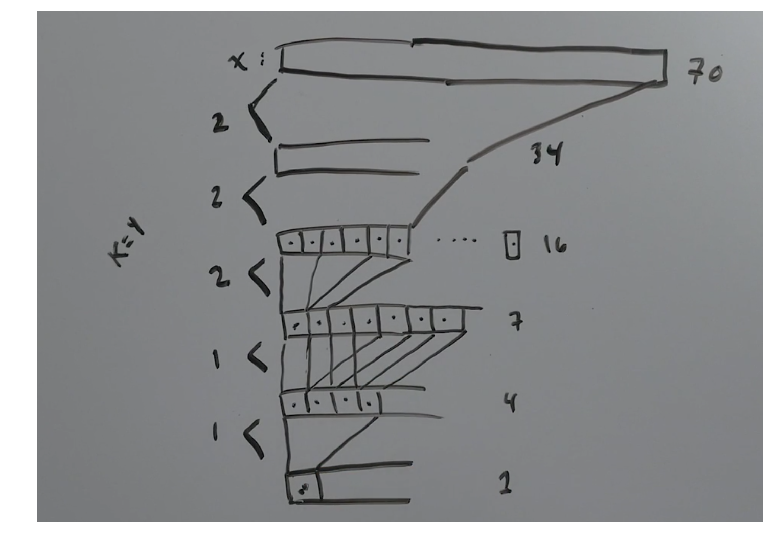

In [0]:
plt.figure(figsize=(13,10))
plt.imshow(plt.imread('CycleGAN/imgs/receptive-field-sizes.png'))
plt.axis('off')

In the image above, we can see the input layer at the top, and the final layer at the bottom.  Working form the final layer back to the top, we can see how 1 neuron contributes to an increasing number of neurons in preceding layers.  The receptive field for each layer for a single neuron in the last layer is written in the right margin: [1, 4, 7, 16, 34, 70]

The code for the discriminator looks like so:

In [0]:
def discriminator(x, n_filters=64, k_size=4, activation_fn=lrelu,
        normalizer_fn=instance_norm, scope=None, reuse=None):
    with tf.variable_scope(scope or 'discriminator', reuse=reuse):
        h = tfl.conv2d(
                inputs=x,
                num_outputs=n_filters,
                kernel_size=k_size,
                stride=2,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                activation_fn=activation_fn,
                normalizer_fn=None,
                scope='1',
                reuse=reuse)
        h = tfl.conv2d(
                inputs=h,
                num_outputs=n_filters * 2,
                kernel_size=k_size,
                stride=2,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                activation_fn=activation_fn,
                normalizer_fn=normalizer_fn,
                scope='2',
                reuse=reuse)
        h = tfl.conv2d(
                inputs=h,
                num_outputs=n_filters * 4,
                kernel_size=k_size,
                stride=2,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                activation_fn=activation_fn,
                normalizer_fn=normalizer_fn,
                scope='3',
                reuse=reuse)
        h = tfl.conv2d(
                inputs=h,
                num_outputs=n_filters * 8,
                kernel_size=k_size,
                stride=1,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                activation_fn=activation_fn,
                normalizer_fn=normalizer_fn,
                scope='4',
                reuse=reuse)
        h = tfl.conv2d(
                inputs=h,
                num_outputs=1,
                kernel_size=k_size,
                stride=1,
                weights_initializer=tf.truncated_normal_initializer(stddev=0.02),
                biases_initializer=None,
                activation_fn=tf.nn.sigmoid,
                scope='5',
                reuse=reuse)
        return h

# Connecting the Pieces

Now we've got all the major components we need to create a CycleGAN.  We just need to connect them up using a few placeholders, create our loss functions, and finally build our training method.  Let's start with our placeholders.

We'll start with placeholders for each of the two collections which I'll call `X` and `Y`:

In [0]:
img_size = 256
X_real = tf.placeholder(name='X', shape=[1, img_size, img_size, 3], dtype=tf.float32)
Y_real = tf.placeholder(name='Y', shape=[1, img_size, img_size, 3], dtype=tf.float32)

To get the "fake" outputs of these "real" inputs, we give them to a corresponding generator.  We'll have one generator for each direction that we'd like to go in.  One which converts the X style to a Y style, and vice-versa.

In [0]:
X_fake = generator(Y_real, scope='G_yx')
Y_fake = generator(X_real, scope='G_xy')

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Deprecated in favor of operator or tf.math.divide.


Because this is a CycleGAN, we'll enforce an additional constraint on the generated output to match the original image quality with an L1-Loss.  This will effectively test both generators by generating from X to Y and then back to X again. Similarly, for Y, we'll generate to X, and again to Y.  To get these images, we simple reuse the existing generators and create the cycle images:

In [0]:
X_cycle = generator(Y_fake, scope='G_yx', reuse=True)
Y_cycle = generator(X_fake, scope='G_xy', reuse=True)

NameError: ignored

Our discriminators will then act on the `real` and `fake` images like so:

In [0]:
D_X_real = discriminator(X_real, scope='D_X')
D_Y_real = discriminator(Y_real, scope='D_Y')
D_X_fake = discriminator(X_fake, scope='D_X', reuse=True)
D_Y_fake = discriminator(Y_fake, scope='D_Y', reuse=True)

To create our generator's loss, we'll compute the L1 distance between the `cycle` and `real` images, and test how well the generator "fools" the discriminator:

In [0]:
l1 = 10.0
loss_cycle = tf.reduce_mean(l1 * tf.abs(X_real - X_cycle)) + \
             tf.reduce_mean(l1 * tf.abs(Y_real - Y_cycle))
loss_G_xy = tf.reduce_mean(tf.square(D_Y_fake - 1.0)) + loss_cycle
loss_G_yx = tf.reduce_mean(tf.square(D_X_fake - 1.0)) + loss_cycle

The authors suggest to use a constant weighting on the L1 cycle loss of 10.0.

Finally, we'll need to compute the loss for our discriminators.  Unlike the generators which use the current generation of fake images, we'll actually use a history buffer of generated images, and randomly sample a generated image from this history buffer.  Previous work on GANs has shown this can help training and the CycleGAN authors suggest using it as well.  We'll take care of keeping track of this history buffer on the CPU side of things and create a placeholder for the TensorFlow graph to help send the history image into the graph:

In [0]:
X_fake_sample = tf.placeholder(name='X_fake_sample',
        shape=[None, img_size, img_size, 3], dtype=tf.float32)
Y_fake_sample = tf.placeholder(name='Y_fake_sample',
        shape=[None, img_size, img_size, 3], dtype=tf.float32)

Now we'll ask the discriminator to assess these images:

In [0]:
D_X_fake_sample = discriminator(X_fake_sample, scope='D_X', reuse=True)
D_Y_fake_sample = discriminator(Y_fake_sample, scope='D_Y', reuse=True)

And now we can create our loss for the discriminator.  Unlike the original GAN implementation, we use a square loss instead of binary cross entropy loss.  This turns out to be a bit less prone to errors:

In [0]:
loss_D_Y = (tf.reduce_mean(tf.square(D_Y_real - 1.0)) + \
            tf.reduce_mean(tf.square(D_Y_fake_sample))) / 2.0
loss_D_X = (tf.reduce_mean(tf.square(D_X_real - 1.0)) + \
            tf.reduce_mean(tf.square(D_X_fake_sample))) / 2.0

# Optimizer

Let's now take a look at how to build optimizers for such a model.  I've wrapped everything we've just done into a convenient module called `cycle_gan`.  We can create the entire network like so:

In [0]:
tf.reset_default_graph()
from cadl.cycle_gan import cycle_gan
net = cycle_gan(img_size=img_size)

This will return the entire network in a dict for us:

In [0]:
list(net.items())

[('G_vars',
  [<tf.Variable 'G_xy/encoder/1/Conv/weights:0' shape=(7, 7, 3, 32) dtype=float32_ref>,
   <tf.Variable 'G_xy/encoder/1/instance_norm/scale:0' shape=(32,) dtype=float32_ref>,
   <tf.Variable 'G_xy/encoder/1/instance_norm/offset:0' shape=(32,) dtype=float32_ref>,
   <tf.Variable 'G_xy/encoder/2/Conv/weights:0' shape=(3, 3, 32, 64) dtype=float32_ref>,
   <tf.Variable 'G_xy/encoder/2/instance_norm/scale:0' shape=(64,) dtype=float32_ref>,
   <tf.Variable 'G_xy/encoder/2/instance_norm/offset:0' shape=(64,) dtype=float32_ref>,
   <tf.Variable 'G_xy/encoder/3/Conv/weights:0' shape=(3, 3, 64, 128) dtype=float32_ref>,
   <tf.Variable 'G_xy/encoder/3/instance_norm/scale:0' shape=(128,) dtype=float32_ref>,
   <tf.Variable 'G_xy/encoder/3/instance_norm/offset:0' shape=(128,) dtype=float32_ref>,
   <tf.Variable 'G_xy/block_0/residual/1/Conv/weights:0' shape=(3, 3, 128, 128) dtype=float32_ref>,
   <tf.Variable 'G_xy/block_0/residual/1/instance_norm/scale:0' shape=(128,) dtype=float32_ref

Just like in the original GAN implementation, we'll create individual optimizers which can only update certain parts of the network.  The original GAN had two optimizers, one for the generator and one for the discriminator.  Even though the discriminator depends on input from the generator, we would only optimize the variables belonging to the discriminator when training the discriminator.  If we did not do this, we'd be making the generator *worse*, when what we really want to happen is for both networks to get better.  We'll do the same thing here, except now we actually have 3 networks to optimize, and so we'll need 3 optimizers: `G_xy` and `G_yx` variables will be optimized as the generator, while `D_X`, and `D_Y`, should update two different discriminators.

First let's get the variables:

In [0]:
training_vars = tf.trainable_variables()
D_X_vars = [v for v in training_vars if v.name.startswith('D_X')]
D_Y_vars = [v for v in training_vars if v.name.startswith('D_Y')]
G_xy_vars = [v for v in training_vars if v.name.startswith('G_xy')]
G_yx_vars = [v for v in training_vars if v.name.startswith('G_yx')]
G_vars = G_xy_vars + G_yx_vars

And then build the optimizers:

In [0]:
learning_rate = 0.001
D_X = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(
        net['loss_D_X'], var_list=D_X_vars)
D_Y = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(
        net['loss_D_Y'], var_list=D_Y_vars)
G = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(
        net['loss_G'], var_list=G_vars)

Note that we concatenated both generators into one variable list:

In [0]:
print(G)

name: "Adam_5"
op: "NoOp"
input: "^Adam_5/update_G_xy/encoder/1/Conv/weights/ApplyAdam"
input: "^Adam_5/update_G_xy/encoder/1/instance_norm/scale/ApplyAdam"
input: "^Adam_5/update_G_xy/encoder/1/instance_norm/offset/ApplyAdam"
input: "^Adam_5/update_G_xy/encoder/2/Conv/weights/ApplyAdam"
input: "^Adam_5/update_G_xy/encoder/2/instance_norm/scale/ApplyAdam"
input: "^Adam_5/update_G_xy/encoder/2/instance_norm/offset/ApplyAdam"
input: "^Adam_5/update_G_xy/encoder/3/Conv/weights/ApplyAdam"
input: "^Adam_5/update_G_xy/encoder/3/instance_norm/scale/ApplyAdam"
input: "^Adam_5/update_G_xy/encoder/3/instance_norm/offset/ApplyAdam"
input: "^Adam_5/update_G_xy/block_0/residual/1/Conv/weights/ApplyAdam"
input: "^Adam_5/update_G_xy/block_0/residual/1/instance_norm/scale/ApplyAdam"
input: "^Adam_5/update_G_xy/block_0/residual/1/instance_norm/offset/ApplyAdam"
input: "^Adam_5/update_G_xy/block_0/residual/2/Conv/weights/ApplyAdam"
input: "^Adam_5/update_G_xy/block_0/residual/2/instance_norm/scale/Apply

As part of the discriminator training, we test how it classifies real images and generated images.  For the generated images, the discriminator takes a randomly generated image from the last 50 some generated images.  This is to make the training a bit more stable, according to: Shrivastava, A., Pfister, T., Tuzel, O., Susskind, J., Wang, W., & Webb, R. (2016). Learning from Simulated and Unsupervised Images through Adversarial Training. Retrieved from http://arxiv.org/abs/1612.07828 - see Section 2.3 for details.  The idea here is the discriminator should still be able to say that older generated images are fake.  It may be the case that the generator just re-learns things the discriminator has forgotten about, and this might help with making things more stable.

To set this up, we determine our `capacity`, such as 50 images, and create a list of images all initialized to 0:

In [0]:
# How many fake generations to keep around
capacity = 50

# Storage for fake generations
fake_Xs = capacity * [np.zeros((1, img_size, img_size, 3), dtype=np.float32)]
fake_Ys = capacity * [np.zeros((1, img_size, img_size, 3), dtype=np.float32)]

# Batch Generator

Finally, we're almost ready to train.  We just need data!  The most important part!  I've included two kinds of batch generators to help you get data into your CycleGAN network.  One takes your X and Y image collections as arrays.  The other takes a single image for X and Y and will randomly crop it.  I've successfully used this network with very large images, including Hieronymous Bosch's Garden of Earthly Delights.  The first collection was a sketch rendering, and the second was a high resolution image.

In [0]:
from cadl.cycle_gan import batch_generator_dataset, batch_generator_random_crop

To use the dataset generator, feed in two arrays images shaped: `N` x `H` x `W` x 3:

In [0]:
# Load your data into imgs1 and imgs2 here!
# I've loaded in random noise as an example, but you'll want to use
# plt.imread or skimage to load in images into a list of images
#ds_X, ds_Y = np.random.rand(10, img_size, img_size, 3), \
             #np.random.rand(10, img_size, img_size, 3)
  
#Commenting the random datanoise creation to load actual images in ds_X & ds_Y
from PIL import Image
from matplotlib import pylab as plt


X_list = []
Y_list = []

#xx1 = Image.open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingTrainingdata/Europe/europe2.jpg')

for x in range(1215):
  
  img_x = Image.open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingTrainingdata/Europe/europe'+str(x+1)+'.jpg')
  #print('Found file - europe'+str(x+1)+'.jpg')
  img_x=img_x.resize((256,256))
  img_arr_x=np.asarray(img_x)
  
  if(img_arr_x.shape == (256,256,3)):
    X_list.append(img_arr_x)
  

  

In [0]:
for y in range(1151):
  img_y = Image.open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingTrainingdata/China/China'+str(y+1)+'.jpg')
  img_y=img_y.resize((256,256))
  img_arr_y=np.asarray(img_y)
  
  if(img_arr_y.shape == (256,256,3)):
    Y_list.append(img_arr_y)


In [0]:
#loading our data into ds_X. ds_Y here
ds_X, ds_Y = np.asarray(X_list),np.asarray(Y_list)

In [0]:
ds_X.shape

(1182, 256, 256, 3)

In [0]:
ds_Y.shape

(1137, 256, 256, 3)

Now you can get batches into your CycleGAN network using the `batch_generator_dataset` function:

In [0]:
#Commenting below code to avoid mixup for training
# X_i, Y_i = next(batch_generator_dataset(ds_X, ds_Y))
# X_i.shape, Y_i.shape

Alternatively, you can grab random crops of a larger image using the `batch_generator_random_crop` function and feed these into your network instead.  You'll want to set the `min_size` and `max_size` parameters to determine what can be cropped and what the crop should be reshaped to.

In [0]:
#Commenting below code to avoid mixup for training

# ds_X, ds_Y = np.random.rand(1024, 1024, 3), np.random.rand(1024, 1024, 3)
# X_i, Y_i = next(batch_generator_random_crop(
#         ds_X, ds_Y, min_size=img_size, max_size=512))
# X_i.shape, Y_i.shape

((1, 256, 256, 3), (1, 256, 256, 3))

# Training

The CADL `cycle_gan` module includes a train function.  But if you're curious to know the details of training, I've commented the code below:

In [0]:
from PIL import Image

In [0]:
idx = 0
it_i = 0
n_epochs = 1
ckpt_path = './'

570 G: 2327.474 D_X: 0.55150384 D_Y: 0.57883
571 G: 2529.5886 D_X: 0.59136105 D_Y: 0.572399
572 G: 2194.3518 D_X: 0.5996469 D_Y: 0.55333924
573 G: 2641.3545 D_X: 0.577518 D_Y: 0.5579909
574 G: 2654.813 D_X: 0.5778147 D_Y: 0.557392
575 G: 2103.0479 D_X: 0.57967126 D_Y: 0.54717237
576 G: 2670.9353 D_X: 0.580475 D_Y: 0.56024945
577 G: 2739.2568 D_X: 0.5662199 D_Y: 0.5482861
578 G: 2470.0205 D_X: 0.5536914 D_Y: 0.5409596
579 G: 2238.3809 D_X: 0.5181798 D_Y: 0.54213154
580 G: 2354.6604 D_X: 0.52005124 D_Y: 0.5484157
581 G: 2013.4796 D_X: 0.51265967 D_Y: 0.5299464
582 G: 2649.5203 D_X: 0.5214604 D_Y: 0.5517397
583 G: 2106.1738 D_X: 0.5225595 D_Y: 0.5462005
584 G: 2100.1736 D_X: 0.5120011 D_Y: 0.534199
585 G: 3158.7898 D_X: 0.51876235 D_Y: 0.53265154
586 G: 2504.2495 D_X: 0.50146556 D_Y: 0.51996565
587 G: 2855.0703 D_X: 0.5005998 D_Y: 0.541053
588 G: 2959.4397 D_X: 0.519237 D_Y: 0.52983737
589 G: 2076.4536 D_X: 0.50847036 D_Y: 0.52788585
590 G: 2852.2896 D_X: 0.51685053 D_Y: 0.5130285
591 G: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


<class 'numpy.ndarray'>
<class 'numpy.ndarray'>


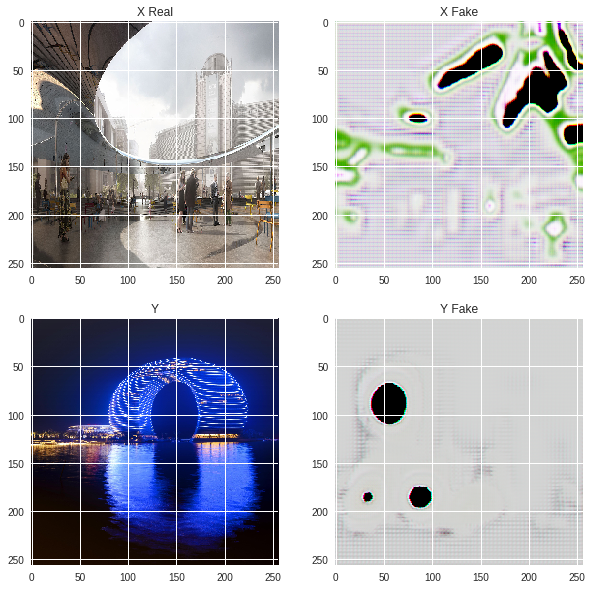

In [0]:
# Train
with tf.Session() as sess:
    # Build an init op for our variables
    init_op = tf.group(tf.global_variables_initializer(),
                       tf.local_variables_initializer())
    sess.run(init_op)
    
    # We'll also save our model so we can load it up again
    saver = tf.train.Saver()
    writer = tf.summary.FileWriter(ckpt_path)
    
    for epoch_i in range(n_epochs):
        # You'll want to use the approriate batch generator here!
        for X, Y in batch_generator_dataset(ds_X, ds_Y):

            # First generate in both directions
            X_fake, Y_fake = sess.run(
                [net['X_fake'], net['Y_fake']],
                feed_dict={net['X_real']: X,
                           net['Y_real']: Y})

            # Now sample from history
            if it_i < capacity:
                # Not enough samples yet, fill up history buffer
                fake_Xs[idx] = X_fake
                fake_Ys[idx] = Y_fake
                idx = (idx + 1) % capacity
            elif np.random.random() > 0.5:
                # Swap out a random idx from history
                rand_idx = np.random.randint(0, capacity)
                fake_Xs[rand_idx], X_fake = X_fake, fake_Xs[rand_idx]
                fake_Ys[rand_idx], Y_fake = Y_fake, fake_Ys[rand_idx]
            else:
                # Use current generation
                pass

            # Optimize G Networks
            loss_G = sess.run(
                [net['loss_G'], G],
                feed_dict={
                    net['X_real']: X,
                    net['Y_real']: Y,
                    net['Y_fake_sample']: Y_fake,
                    net['X_fake_sample']: X_fake
                })[0]

            # Optimize D_Y
            loss_D_Y = sess.run(
                [net['loss_D_Y'], D_Y],
                feed_dict={
                    net['X_real']: X,
                    net['Y_real']: Y,
                    net['Y_fake_sample']: Y_fake
                })[0]

            # Optimize D_X
            loss_D_X = sess.run(
                [net['loss_D_X'], D_X],
                feed_dict={
                    net['X_real']: X,
                    net['Y_real']: Y,
                    net['X_fake_sample']: X_fake
                })[0]

            print(it_i, 'G:', loss_G, 'D_X:', loss_D_X, 'D_Y:', loss_D_Y)

            # Update summaries
            if it_i % 100 == 0:
                summary = sess.run(
                    net['summaries'],
                    feed_dict={
                        net['X_real']: X,
                        net['Y_real']: Y,
                        net['X_fake_sample']: X_fake,
                        net['Y_fake_sample']: Y_fake
                    })
                writer.add_summary(summary, it_i)
            it_i += 1

        # Save
        if epoch_i % 50 == 0:
            saver.save(
                sess,
                os.path.join(ckpt_path, 'model.ckpt'),
                global_step=epoch_i)
        
        
        print(type(X[0]))
        
        print(type(np.clip(X[0], 0.0, 1.0)))
        
        
        # Show generative images:        
        fig, axs = plt.subplots(2, 2, figsize=(10, 10))
        axs[0][0].set_title('X Real')
        axs[0][0].imshow(X[0])
        
        
        #Adding code to save X_real to google drive
        #im_xreal = Image.fromarray(np.clip(X[0], 0.0, 1.0))
        im_xreal = Image.fromarray(X[0],'RGB')
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/1epochs/'+'epoch_'+str(epoch_i)+'_Xreal.jpg', 'w') as f:
          im_xreal.save(f)
        
        axs[0][1].set_title('X Fake')
        axs[0][1].imshow(X_fake[0])
        
        #Adding code to save X_fake to google drive
        #im_xfake = Image.fromarray(np.clip(X_fake[0], 0.0, 1.0))
        im_xfake = Image.fromarray(X_fake[0], 'RGB')
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/1epochs/'+'epoch_'+str(epoch_i)+'_Xfake.jpg', 'w') as f:
          im_xfake.save(f)
        
        axs[1][0].set_title('Y')
        axs[1][0].imshow(Y[0])
        
        #Adding code to save Y to google drive
        #im_y = Image.fromarray(np.clip(Y[0], 0.0, 1.0))
        im_y = Image.fromarray(Y[0], 'RGB')
        
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/1epochs/'+'epoch_'+str(epoch_i)+'_Yreal.jpg', 'w') as f:
          im_y.save(f)
        
        
        axs[1][1].set_title('Y Fake')
        axs[1][1].imshow(Y_fake[0])
        
        #Adding code to save Y fake to google drive
        #im_yfake = Image.fromarray(np.clip(Y_fake[0], 0.0, 1.0))
        im_yfake = Image.fromarray(Y_fake[0], 'RGB')
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/1epochs/'+'epoch_'+str(epoch_i)+'_Yfake.jpg', 'w') as f:
          im_yfake.save(f)
        
        fig.show()

In [0]:
#import tensorflow as tf
#import os


with tf.Session() as sess:
  
  init_op = tf.group(tf.global_variables_initializer(),
                       tf.local_variables_initializer())
  sess.run(init_op)
    
    # We'll also save our model so we can load it up again
  saver = tf.train.Saver()
  # Restore variables from disk.
  pth = os.path.join(ckpt_path, 'model.ckpt-0')
  print(pth)
  saver.restore(sess, "./model.ckpt-0")
  print("Model restored....")
  #X_fake_new, Y_fake_new

  ds_X_new = np.asarray([ds_X[0]])
  ds_Y_new = np.asarray([ds_Y[0]])
  print(ds_X_new.shape)
  print(ds_Y_new.shape)
  for X, Y in batch_generator_dataset(ds_X_new, ds_Y_new):
    X_fake_new, Y_fake_new = sess.run(
                [net['X_fake'], net['Y_fake']],
                feed_dict={net['X_real']: X,
                           net['Y_real']: Y})
  

./model.ckpt-0
INFO:tensorflow:Restoring parameters from ./model.ckpt-0
Model restored....
(1, 256, 256, 3)
(1, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


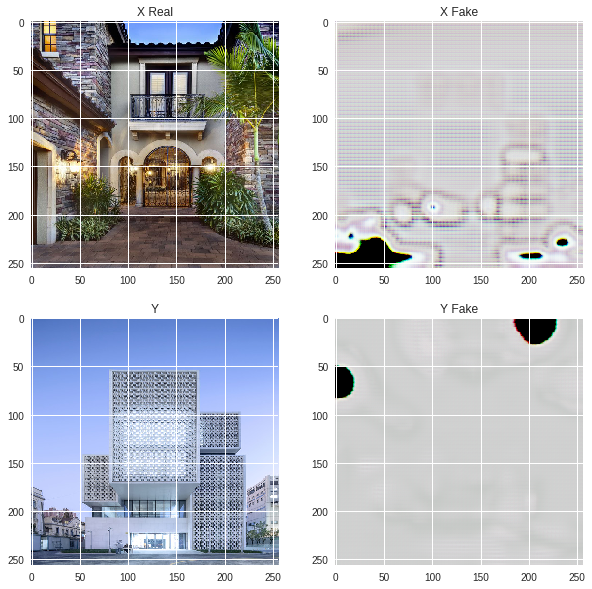

In [0]:
fig, axs = plt.subplots(2, 2, figsize=(10, 10))
axs[0][0].set_title('X Real')
axs[0][0].imshow(X[0])

axs[0][1].set_title('X Fake')
axs[0][1].imshow(X_fake_new[0])

axs[1][0].set_title('Y')
axs[1][0].imshow(Y[0])

axs[1][1].set_title('Y Fake')
axs[1][1].imshow(Y_fake_new[0])


In [0]:
idx = 0
it_i = 0
n_epochs = 10
ckpt_path = './'

11370 G: 2528.6396 D_X: 0.58211184 D_Y: 0.59083045
11371 G: 2628.0396 D_X: 0.5873283 D_Y: 0.5656887
11372 G: 3169.533 D_X: 0.56910884 D_Y: 0.56745166
11373 G: 1982.8492 D_X: 0.5825883 D_Y: 0.56275064
11374 G: 2314.833 D_X: 0.6086632 D_Y: 0.54384005
11375 G: 2478.8926 D_X: 0.59964657 D_Y: 0.5156398
11376 G: 2548.6243 D_X: 0.5796991 D_Y: 0.53056216
11377 G: 2821.686 D_X: 0.5497725 D_Y: 0.52961946
11378 G: 2516.7493 D_X: 0.5522227 D_Y: 0.53216577
11379 G: 2700.0205 D_X: 0.55362976 D_Y: 0.52890706
11380 G: 2917.0117 D_X: 0.5597635 D_Y: 0.5112115
11381 G: 2619.042 D_X: 0.5677271 D_Y: 0.5002564
11382 G: 2616.1372 D_X: 0.5544679 D_Y: 0.5012837
11383 G: 1879.9125 D_X: 0.53636503 D_Y: 0.4944191
11384 G: 2151.4404 D_X: 0.53919154 D_Y: 0.48905742
11385 G: 2890.3733 D_X: 0.5501647 D_Y: 0.4980891
11386 G: 2350.1958 D_X: 0.5502069 D_Y: 0.5001277
11387 G: 2560.053 D_X: 0.54412687 D_Y: 0.47790962
11388 G: 3319.8208 D_X: 0.5198996 D_Y: 0.5343505
11389 G: 2468.682 D_X: 0.51811165 D_Y: 0.5124674
11390 G:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12507 G: 2399.5613 D_X: 0.41341442 D_Y: 0.39770815
12508 G: 2753.579 D_X: 0.39716104 D_Y: 0.55658305
12509 G: 2452.1436 D_X: 0.4054588 D_Y: 0.3902713
12510 G: 2805.3447 D_X: 0.40133685 D_Y: 0.41285172
12511 G: 3023.2576 D_X: 0.39892152 D_Y: 0.40560025
12512 G: 3289.537 D_X: 0.4010689 D_Y: 0.39381492
12513 G: 2486.859 D_X: 0.39746517 D_Y: 0.39044714
12514 G: 2809.9644 D_X: 0.40481782 D_Y: 0.4004963
12515 G: 3137.5552 D_X: 0.40372822 D_Y: 0.40972173
12516 G: 1970.1746 D_X: 0.40172786 D_Y: 0.39382017
12517 G: 2906.9102 D_X: 0.3988428 D_Y: 0.4133728
12518 G: 2176.9666 D_X: 0.40806395 D_Y: 0.3982634
12519 G: 2855.8218 D_X: 0.39803022 D_Y: 0.40202647
12520 G: 2879.4253 D_X: 0.393554 D_Y: 0.3981552
12521 G: 2685.8452 D_X: 0.39653826 D_Y: 0.39881837
12522 G: 2428.594 D_X: 0.4033851 D_Y: 0.39776406
12523 G: 2503.4226 D_X: 0.3939646 D_Y: 0.39503026
12524 G: 2124.524 D_X: 0.3959243 D_Y: 0.3979668
12525 G: 3446.4326 D_X: 0.39263672 D_Y: 0.42013672
12526 G: 3022.865 D_X: 0.39695832 D_Y: 0.40303272


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


13643 G: 2810.0073 D_X: 0.3356705 D_Y: 0.3346104
13644 G: 2361.205 D_X: 0.32850933 D_Y: 0.31810683
13645 G: 2166.447 D_X: 0.3276751 D_Y: 0.3204734
13646 G: 2797.8975 D_X: 0.33070606 D_Y: 0.32831568
13647 G: 1464.3232 D_X: 0.32655555 D_Y: 0.3498159
13648 G: 1575.146 D_X: 0.34100884 D_Y: 0.32198676
13649 G: 2421.43 D_X: 0.33222634 D_Y: 0.3383446
13650 G: 2469.7832 D_X: 0.33601338 D_Y: 0.3203623
13651 G: 2518.576 D_X: 0.3275764 D_Y: 0.33051115
13652 G: 1983.5251 D_X: 0.3205703 D_Y: 0.3275649
13653 G: 2852.5508 D_X: 0.32408988 D_Y: 0.32714176
13654 G: 2484.0647 D_X: 0.32398057 D_Y: 0.31313157
13655 G: 2504.9993 D_X: 0.3263854 D_Y: 0.32422855
13656 G: 1586.4316 D_X: 0.3317266 D_Y: 0.32268882
13657 G: 2149.7026 D_X: 0.3285491 D_Y: 0.32641256
13658 G: 3326.593 D_X: 0.35104433 D_Y: 0.3436267
13659 G: 3389.029 D_X: 0.338013 D_Y: 0.32294694
13660 G: 2656.072 D_X: 0.32163137 D_Y: 0.32743305
13661 G: 3066.5864 D_X: 0.3510758 D_Y: 0.31819677
13662 G: 2961.7866 D_X: 0.35308135 D_Y: 0.32631904
13663 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


14780 G: 3116.7092 D_X: 0.2717706 D_Y: 0.46580005
14781 G: 2281.231 D_X: 0.2757923 D_Y: 0.35098684
14782 G: 2793.145 D_X: 0.26109582 D_Y: 0.3245498
14783 G: 2391.0356 D_X: 0.2850211 D_Y: 0.3160557
14784 G: 2595.1855 D_X: 0.27255517 D_Y: 0.31904292
14785 G: 1512.7714 D_X: 0.26567605 D_Y: 0.32481062
14786 G: 2612.3657 D_X: 0.28415275 D_Y: 0.36016566
14787 G: 2931.7983 D_X: 0.27738315 D_Y: 0.4269994
14788 G: 2330.2637 D_X: 0.262343 D_Y: 0.3345851
14789 G: 2450.8975 D_X: 0.2722999 D_Y: 0.37156436
14790 G: 2549.7983 D_X: 0.29645348 D_Y: 0.37352943
14791 G: 3771.4517 D_X: 0.3174507 D_Y: 0.5623361
14792 G: 2484.9363 D_X: 0.3373975 D_Y: 0.5474051
14793 G: 2614.2395 D_X: 0.2837865 D_Y: 0.33042493
14794 G: 1990.9572 D_X: 0.2722183 D_Y: 0.37083915
14795 G: 2337.1108 D_X: 0.27296257 D_Y: 0.5085912
14796 G: 2715.5417 D_X: 0.2785755 D_Y: 0.30484033
14797 G: 2575.0051 D_X: 0.26727808 D_Y: 0.40209457
14798 G: 2729.217 D_X: 0.28831786 D_Y: 0.38995767
14799 G: 3341.233 D_X: 0.29350296 D_Y: 0.45597374
14

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


15917 G: 2350.697 D_X: 0.24574225 D_Y: 0.25167978
15918 G: 2100.0554 D_X: 0.23461585 D_Y: 0.25001106
15919 G: 2923.204 D_X: 0.238625 D_Y: 0.24431922
15920 G: 2297.4624 D_X: 0.24279216 D_Y: 0.23510678
15921 G: 2750.396 D_X: 0.23537955 D_Y: 0.23424178
15922 G: 2229.4324 D_X: 0.23867989 D_Y: 0.24346623
15923 G: 1761.0 D_X: 0.2363739 D_Y: 0.24263248
15924 G: 3027.1592 D_X: 0.22721705 D_Y: 0.26037976
15925 G: 2609.0244 D_X: 0.23334756 D_Y: 0.24444906
15926 G: 2045.1084 D_X: 0.25879258 D_Y: 0.26181835
15927 G: 2428.4385 D_X: 0.23506762 D_Y: 0.26723176
15928 G: 2011.7561 D_X: 0.24977864 D_Y: 0.2361429
15929 G: 2210.3525 D_X: 0.24347617 D_Y: 0.23588324
15930 G: 2232.1292 D_X: 0.26099205 D_Y: 0.24386539
15931 G: 2375.8884 D_X: 0.267412 D_Y: 0.24475083
15932 G: 2621.761 D_X: 0.257959 D_Y: 0.2507739
15933 G: 3382.6328 D_X: 0.24328119 D_Y: 0.28497118
15934 G: 2385.7324 D_X: 0.22653279 D_Y: 0.24379969
15935 G: 2576.24 D_X: 0.25571635 D_Y: 0.2586841
15936 G: 2204.6597 D_X: 0.23346415 D_Y: 0.24556126

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


17054 G: 2356.9106 D_X: 0.21374908 D_Y: 0.2143797
17055 G: 2695.5527 D_X: 0.21407612 D_Y: 0.2149936
17056 G: 2459.5266 D_X: 0.19335887 D_Y: 0.21662343
17057 G: 3582.8855 D_X: 0.21604991 D_Y: 0.21766227
17058 G: 2986.2773 D_X: 0.21761453 D_Y: 0.21144022
17059 G: 2462.348 D_X: 0.2072597 D_Y: 0.21314037
17060 G: 2107.8687 D_X: 0.28683448 D_Y: 0.21998546
17061 G: 2369.4043 D_X: 0.22143042 D_Y: 0.21385917
17062 G: 2641.079 D_X: 0.23794319 D_Y: 0.2293309
17063 G: 2981.5186 D_X: 0.21595 D_Y: 0.20398766
17064 G: 1979.3906 D_X: 0.25099787 D_Y: 0.20784278
17065 G: 2415.649 D_X: 0.24708743 D_Y: 0.20758474
17066 G: 2544.061 D_X: 0.21935225 D_Y: 0.2016249
17067 G: 2548.6504 D_X: 0.22918934 D_Y: 0.21033147
17068 G: 2507.3357 D_X: 0.2074879 D_Y: 0.216482
17069 G: 2569.4897 D_X: 0.2301274 D_Y: 0.21546069
17070 G: 2378.913 D_X: 0.21034001 D_Y: 0.21150798
17071 G: 2462.9795 D_X: 0.21800232 D_Y: 0.21394125
17072 G: 1737.3027 D_X: 0.21300882 D_Y: 0.20908448
17073 G: 2279.8337 D_X: 0.20885566 D_Y: 0.214087

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


18191 G: 2287.8208 D_X: 0.1806176 D_Y: 0.17220575
18192 G: 2400.3394 D_X: 0.19916302 D_Y: 0.17973411
18193 G: 2472.7622 D_X: 0.17970528 D_Y: 0.17332543
18194 G: 2461.2427 D_X: 0.19215988 D_Y: 0.17964798
18195 G: 2510.6904 D_X: 0.18649414 D_Y: 0.17742422
18196 G: 2635.5242 D_X: 0.19377705 D_Y: 0.17693627
18197 G: 2492.812 D_X: 0.20418349 D_Y: 0.17976373
18198 G: 2740.9258 D_X: 0.21034095 D_Y: 0.17089987
18199 G: 2538.335 D_X: 0.2442508 D_Y: 0.1843473
18200 G: 2345.5776 D_X: 0.17454651 D_Y: 0.16693337
18201 G: 2245.1138 D_X: 0.19582316 D_Y: 0.1837447
18202 G: 2352.1882 D_X: 0.17012966 D_Y: 0.17631714
18203 G: 1990.335 D_X: 0.18919802 D_Y: 0.175975
18204 G: 2805.418 D_X: 0.21447985 D_Y: 0.18528765
18205 G: 2112.4727 D_X: 0.20499322 D_Y: 0.17517775
18206 G: 1957.9896 D_X: 0.1830475 D_Y: 0.17932114
18207 G: 2408.8008 D_X: 0.20018302 D_Y: 0.17943001
18208 G: 2309.6125 D_X: 0.17239626 D_Y: 0.19097063
18209 G: 2463.8599 D_X: 0.18002442 D_Y: 0.17745993
18210 G: 2383.3545 D_X: 0.19311877 D_Y: 0.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


19328 G: 3194.3774 D_X: 0.17053534 D_Y: 0.15558478
19329 G: 2037.3022 D_X: 0.15369128 D_Y: 0.16106339
19330 G: 2847.083 D_X: 0.15568064 D_Y: 0.16274711
19331 G: 2538.9736 D_X: 0.16271803 D_Y: 0.15838271
19332 G: 2486.8044 D_X: 0.1562269 D_Y: 0.16344057
19333 G: 2410.478 D_X: 0.16362119 D_Y: 0.15760034
19334 G: 3076.6514 D_X: 0.16574965 D_Y: 0.16029614
19335 G: 2922.1777 D_X: 0.16027336 D_Y: 0.16258392
19336 G: 2317.1094 D_X: 0.17732313 D_Y: 0.155562
19337 G: 2099.8242 D_X: 0.16051261 D_Y: 0.15520528
19338 G: 2528.5835 D_X: 0.1555782 D_Y: 0.16173892
19339 G: 2816.018 D_X: 0.15713671 D_Y: 0.15742415
19340 G: 2030.7799 D_X: 0.15906173 D_Y: 0.15760711
19341 G: 2690.8389 D_X: 0.15848193 D_Y: 0.15512298
19342 G: 3080.982 D_X: 0.18236533 D_Y: 0.15292555
19343 G: 2369.0312 D_X: 0.15983815 D_Y: 0.16738547
19344 G: 2034.3206 D_X: 0.18981177 D_Y: 0.16481197
19345 G: 2634.1143 D_X: 0.1547158 D_Y: 0.18315527
19346 G: 2652.5828 D_X: 0.17806502 D_Y: 0.16587894
19347 G: 2334.8174 D_X: 0.1628747 D_Y: 0

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


20465 G: 2603.6843 D_X: 0.13633074 D_Y: 0.14227204
20466 G: 1774.9673 D_X: 0.13808441 D_Y: 0.14610183
20467 G: 2061.455 D_X: 0.1395019 D_Y: 0.14449346
20468 G: 2741.5122 D_X: 0.14818051 D_Y: 0.16927773
20469 G: 2690.473 D_X: 0.13328502 D_Y: 0.14579377
20470 G: 2506.3345 D_X: 0.14094886 D_Y: 0.13757777
20471 G: 2662.171 D_X: 0.14575641 D_Y: 0.16068149
20472 G: 3302.2598 D_X: 0.14478412 D_Y: 0.23653275
20473 G: 2162.141 D_X: 0.14636141 D_Y: 0.1531387
20474 G: 2225.715 D_X: 0.14320599 D_Y: 0.15431999
20475 G: 2775.4917 D_X: 0.1399726 D_Y: 0.30553627
20476 G: 2235.0088 D_X: 0.14114463 D_Y: 0.16528103
20477 G: 2799.9434 D_X: 0.14475667 D_Y: 0.17811432
20478 G: 2775.425 D_X: 0.14119163 D_Y: 0.16783084
20479 G: 2061.7988 D_X: 0.13907158 D_Y: 0.15242073
20480 G: 2271.3245 D_X: 0.1352109 D_Y: 0.14237347
20481 G: 2915.8003 D_X: 0.14496739 D_Y: 0.15036993
20482 G: 3073.359 D_X: 0.1404135 D_Y: 0.16154297
20483 G: 2281.2524 D_X: 0.14061621 D_Y: 0.14546664
20484 G: 2175.5073 D_X: 0.13834286 D_Y: 0.1

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


21602 G: 1556.0404 D_X: 0.14478448 D_Y: 0.13538256
21603 G: 2652.559 D_X: 0.13772048 D_Y: 0.1260258
21604 G: 3178.7776 D_X: 0.13233232 D_Y: 0.1434874
21605 G: 2991.3833 D_X: 0.13809064 D_Y: 0.1313131
21606 G: 2285.1028 D_X: 0.12638517 D_Y: 0.1369564
21607 G: 2547.4973 D_X: 0.13332805 D_Y: 0.13270068
21608 G: 2827.7695 D_X: 0.12846872 D_Y: 0.13058238
21609 G: 2950.404 D_X: 0.12556599 D_Y: 0.13526018
21610 G: 3023.8408 D_X: 0.12603682 D_Y: 0.13141763
21611 G: 1748.2432 D_X: 0.12873779 D_Y: 0.12842588
21612 G: 2061.1113 D_X: 0.12603876 D_Y: 0.12022511
21613 G: 2684.5361 D_X: 0.12815356 D_Y: 0.18880655
21614 G: 2332.399 D_X: 0.1290478 D_Y: 0.13198605
21615 G: 1692.6399 D_X: 0.13715847 D_Y: 0.12895027
21616 G: 2633.1665 D_X: 0.12952548 D_Y: 0.12675133
21617 G: 2432.048 D_X: 0.12518616 D_Y: 0.13970852
21618 G: 1945.5835 D_X: 0.12281618 D_Y: 0.13524252
21619 G: 2129.9595 D_X: 0.1298863 D_Y: 0.15339011
21620 G: 2305.0527 D_X: 0.123718455 D_Y: 0.14044729
21621 G: 2483.4648 D_X: 0.13155697 D_Y: 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


22739 G: 2821.7832 D_X: 0.12385804 D_Y: 0.12091318


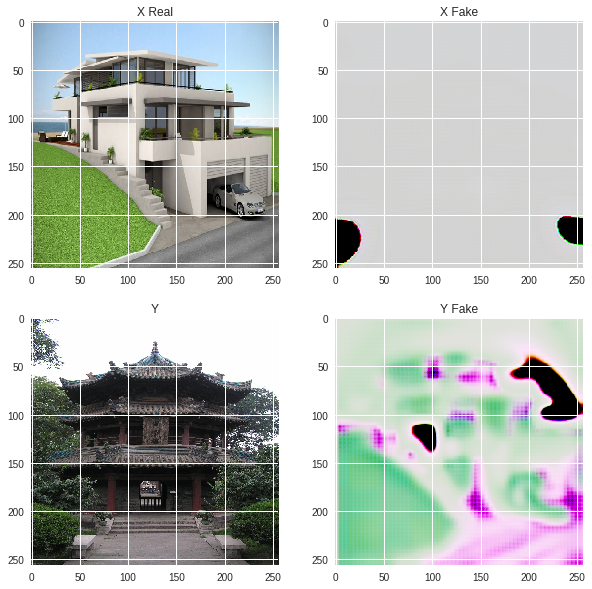

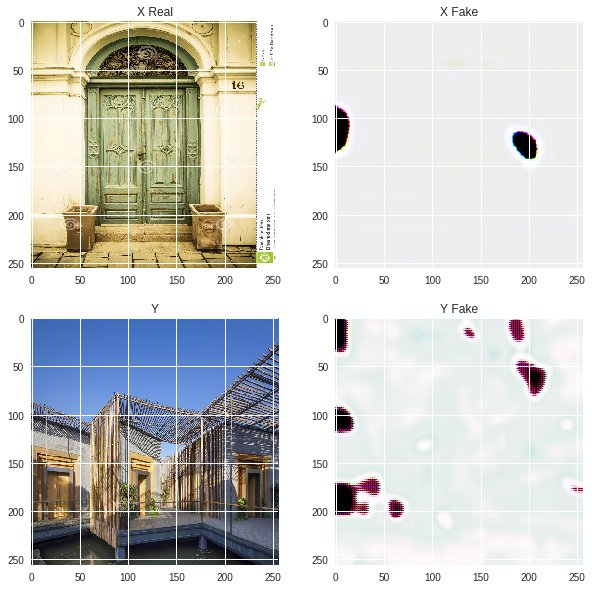

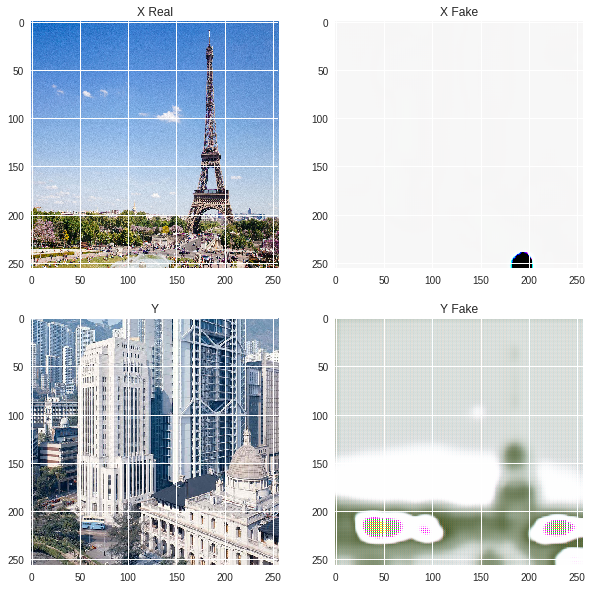

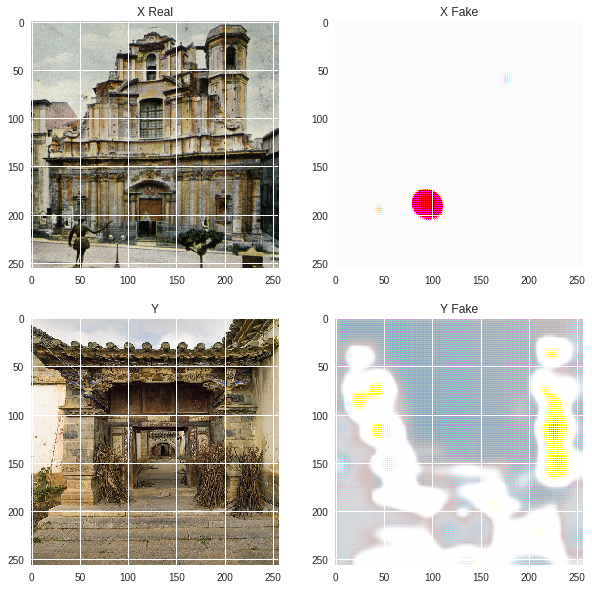

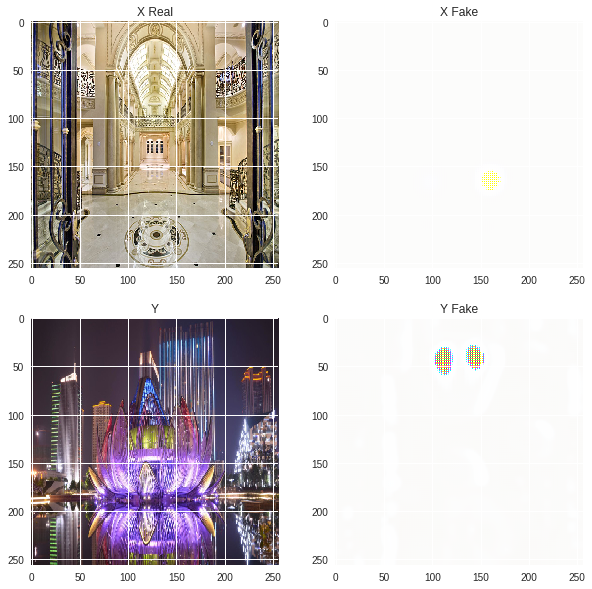

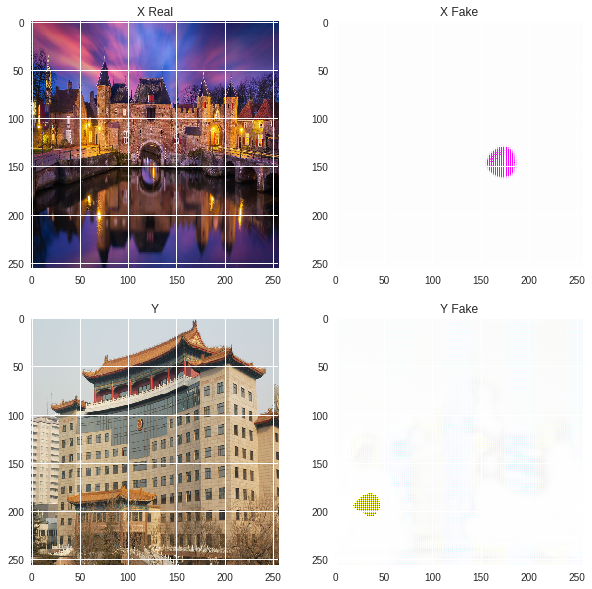

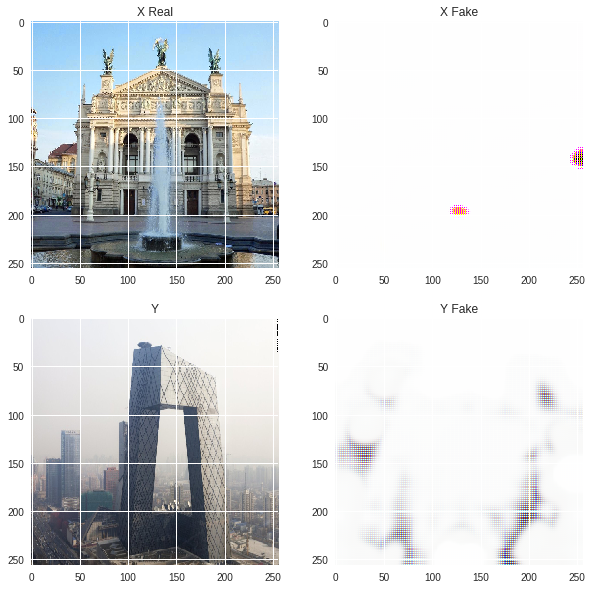

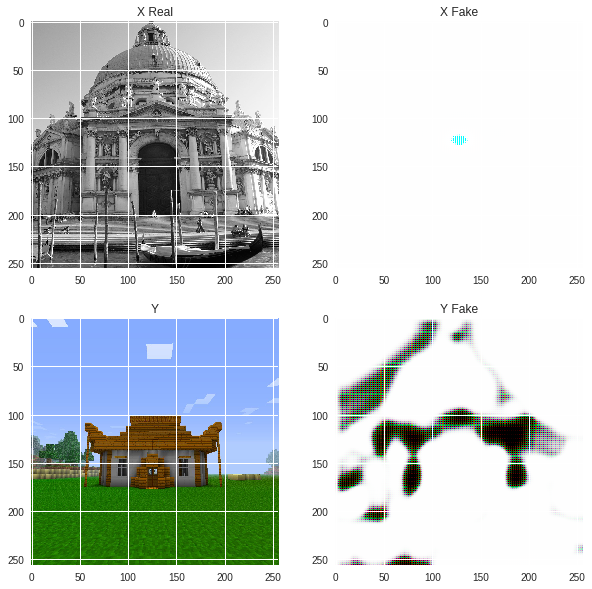

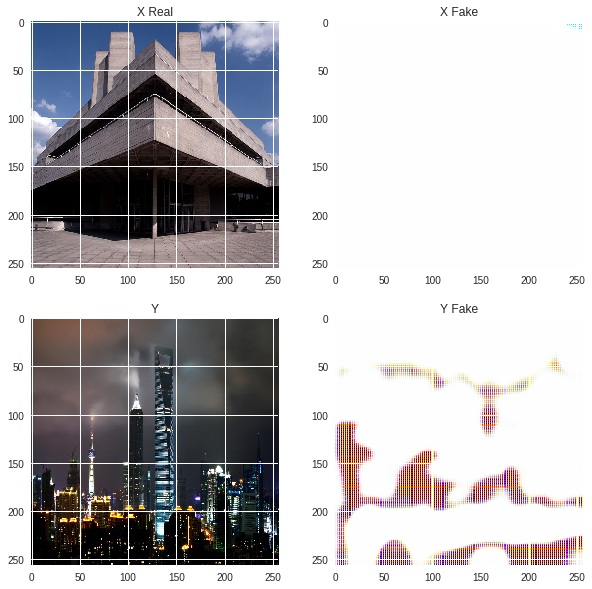

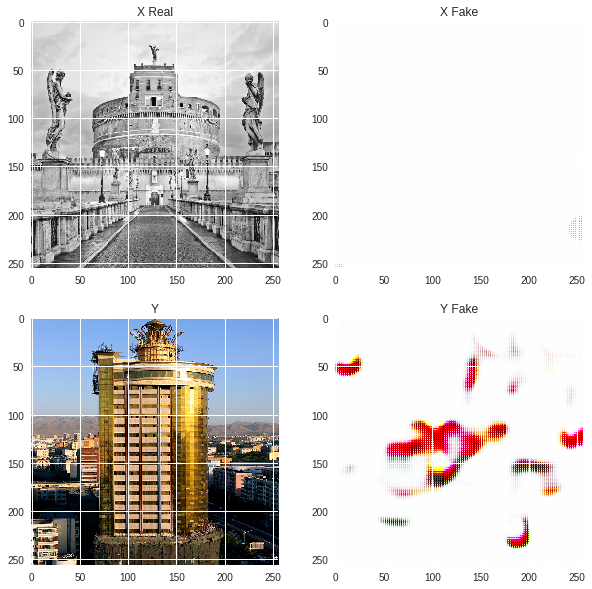

In [0]:
# Train
with tf.Session() as sess:
    # Build an init op for our variables
    init_op = tf.group(tf.global_variables_initializer(),
                       tf.local_variables_initializer())
    sess.run(init_op)
    
    # We'll also save our model so we can load it up again
    saver = tf.train.Saver()
    writer = tf.summary.FileWriter(ckpt_path)
    
    for epoch_i in range(n_epochs):
        # You'll want to use the approriate batch generator here!
        for X, Y in batch_generator_dataset(ds_X, ds_Y):

            # First generate in both directions
            X_fake, Y_fake = sess.run(
                [net['X_fake'], net['Y_fake']],
                feed_dict={net['X_real']: X,
                           net['Y_real']: Y})

            # Now sample from history
            if it_i < capacity:
                # Not enough samples yet, fill up history buffer
                fake_Xs[idx] = X_fake
                fake_Ys[idx] = Y_fake
                idx = (idx + 1) % capacity
            elif np.random.random() > 0.5:
                # Swap out a random idx from history
                rand_idx = np.random.randint(0, capacity)
                fake_Xs[rand_idx], X_fake = X_fake, fake_Xs[rand_idx]
                fake_Ys[rand_idx], Y_fake = Y_fake, fake_Ys[rand_idx]
            else:
                # Use current generation
                pass

            # Optimize G Networks
            loss_G = sess.run(
                [net['loss_G'], G],
                feed_dict={
                    net['X_real']: X,
                    net['Y_real']: Y,
                    net['Y_fake_sample']: Y_fake,
                    net['X_fake_sample']: X_fake
                })[0]

            # Optimize D_Y
            loss_D_Y = sess.run(
                [net['loss_D_Y'], D_Y],
                feed_dict={
                    net['X_real']: X,
                    net['Y_real']: Y,
                    net['Y_fake_sample']: Y_fake
                })[0]

            # Optimize D_X
            loss_D_X = sess.run(
                [net['loss_D_X'], D_X],
                feed_dict={
                    net['X_real']: X,
                    net['Y_real']: Y,
                    net['X_fake_sample']: X_fake
                })[0]

            print(it_i, 'G:', loss_G, 'D_X:', loss_D_X, 'D_Y:', loss_D_Y)

            # Update summaries
            if it_i % 100 == 0:
                summary = sess.run(
                    net['summaries'],
                    feed_dict={
                        net['X_real']: X,
                        net['Y_real']: Y,
                        net['X_fake_sample']: X_fake,
                        net['Y_fake_sample']: Y_fake
                    })
                writer.add_summary(summary, it_i)
            it_i += 1

        # Save
        if epoch_i % 50 == 0:
            saver.save(
                sess,
                os.path.join(ckpt_path, 'model.ckpt'),
                global_step=epoch_i)
        
        
        #print(type(X[0]))
        
        #print(type(np.clip(X[0], 0.0, 1.0)))
        
        
        # Show generative images:        
        fig, axs = plt.subplots(2, 2, figsize=(10, 10))
        axs[0][0].set_title('X Real')
        axs[0][0].imshow(X[0])
        
        
        #Adding code to save X_real to google drive
        #im_xreal = Image.fromarray(np.clip(X[0], 0.0, 1.0))
        im_xreal = Image.fromarray(X[0],'RGB')
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/10epochs/'+'epoch_'+str(epoch_i)+'_Xreal.jpg', 'w') as f:
          im_xreal.save(f)
        
        axs[0][1].set_title('X Fake')
        axs[0][1].imshow(X_fake[0])
        
        #Adding code to save X_fake to google drive
        #im_xfake = Image.fromarray(np.clip(X_fake[0], 0.0, 1.0))
        im_xfake = Image.fromarray(X_fake[0], 'RGB')
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/10epochs/'+'epoch_'+str(epoch_i)+'_Xfake.jpg', 'w') as f:
          im_xfake.save(f)
        
        axs[1][0].set_title('Y')
        axs[1][0].imshow(Y[0])
        
        #Adding code to save Y to google drive
        #im_y = Image.fromarray(np.clip(Y[0], 0.0, 1.0))
        im_y = Image.fromarray(Y[0], 'RGB')
        
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/10epochs/'+'epoch_'+str(epoch_i)+'_Yreal.jpg', 'w') as f:
          im_y.save(f)
        
        
        axs[1][1].set_title('Y Fake')
        axs[1][1].imshow(Y_fake[0])
        
        #Adding code to save Y fake to google drive
        #im_yfake = Image.fromarray(np.clip(Y_fake[0], 0.0, 1.0))
        im_yfake = Image.fromarray(Y_fake[0], 'RGB')
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/10epochs/'+'epoch_'+str(epoch_i)+'_Yfake.jpg', 'w') as f:
          im_yfake.save(f)
        
        fig.show()

In [0]:
!ls

checkpoint  events.out.tfevents.1552315942.e4a073e96509  model.ckpt-0.index
CycleGAN    events.out.tfevents.1552325696.e4a073e96509  model.ckpt-0.meta
drive	    model.ckpt-0.data-00000-of-00001		 sample_data


./model.ckpt-0
INFO:tensorflow:Restoring parameters from ./model.ckpt-0
Model restored....
(4, 256, 256, 3)
(4, 256, 256, 3)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


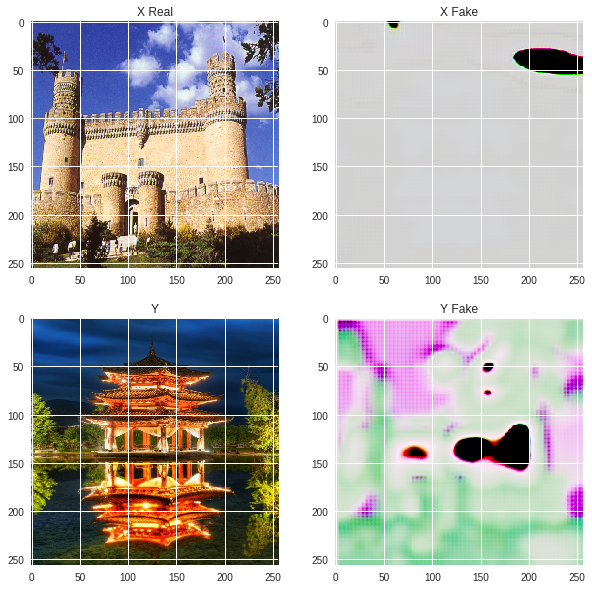

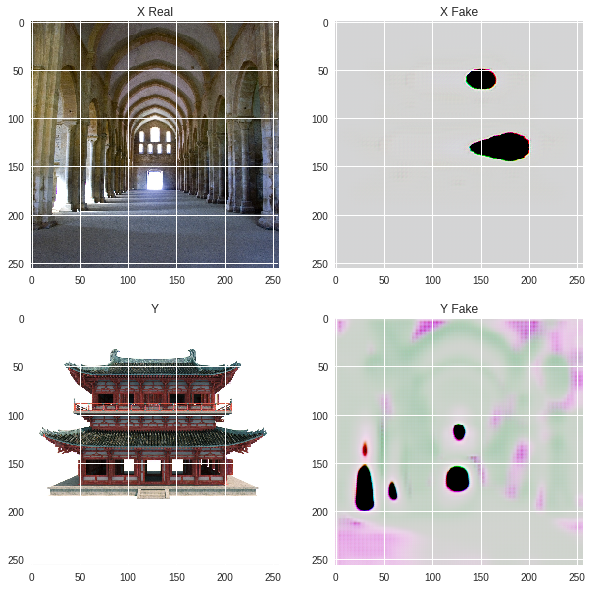

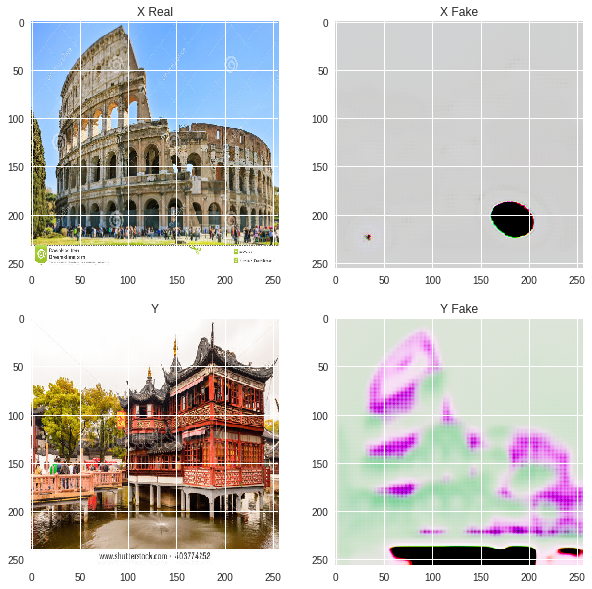

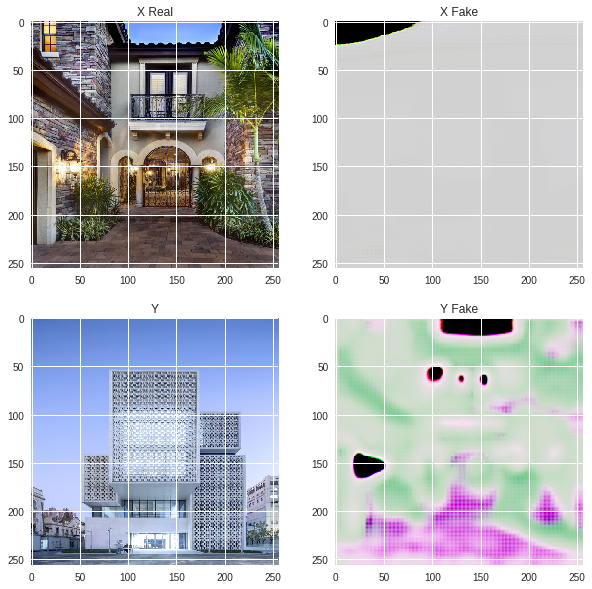

In [0]:
with tf.Session() as sess:
  
  init_op = tf.group(tf.global_variables_initializer(),
                       tf.local_variables_initializer())
  sess.run(init_op)
    
    # We'll also save our model so we can load it up again
  saver = tf.train.Saver()
  # Restore variables from disk.
  pth = os.path.join(ckpt_path, 'model.ckpt-0')
  print(pth)
  saver.restore(sess, "./model.ckpt-0")
  print("Model restored....")

  ds_X_new = np.asarray([ds_X[0],ds_X[23],ds_X[100],ds_X[1000]])
  ds_Y_new = np.asarray([ds_Y[0],ds_Y[23],ds_Y[100],ds_Y[1000]])
  print(ds_X_new.shape)
  print(ds_Y_new.shape)
  for X, Y in batch_generator_dataset(ds_X_new, ds_Y_new):
    X_fake_new, Y_fake_new = sess.run(
                [net['X_fake'], net['Y_fake']],
                feed_dict={net['X_real']: X,
                           net['Y_real']: Y})
    
  
    
    
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    axs[0][0].set_title('X Real')
    axs[0][0].imshow(X[0])

    axs[0][1].set_title('X Fake')
    axs[0][1].imshow(X_fake_new[0])

    axs[1][0].set_title('Y')
    axs[1][0].imshow(Y[0])

    axs[1][1].set_title('Y Fake')
    axs[1][1].imshow(Y_fake_new[0])
  

In [0]:
idx = 0
it_i = 0
n_epochs = 100
ckpt_path = './'

In [0]:
# Train
with tf.Session() as sess:
    # Build an init op for our variables
    init_op = tf.group(tf.global_variables_initializer(),
                       tf.local_variables_initializer())
    sess.run(init_op)
    
    # We'll also save our model so we can load it up again
    saver = tf.train.Saver()
    writer = tf.summary.FileWriter(ckpt_path)
    
    for epoch_i in range(n_epochs):
        # You'll want to use the approriate batch generator here!
        for X, Y in batch_generator_dataset(ds_X, ds_Y):

            # First generate in both directions
            X_fake, Y_fake = sess.run(
                [net['X_fake'], net['Y_fake']],
                feed_dict={net['X_real']: X,
                           net['Y_real']: Y})

            # Now sample from history
            if it_i < capacity:
                # Not enough samples yet, fill up history buffer
                fake_Xs[idx] = X_fake
                fake_Ys[idx] = Y_fake
                idx = (idx + 1) % capacity
            elif np.random.random() > 0.5:
                # Swap out a random idx from history
                rand_idx = np.random.randint(0, capacity)
                fake_Xs[rand_idx], X_fake = X_fake, fake_Xs[rand_idx]
                fake_Ys[rand_idx], Y_fake = Y_fake, fake_Ys[rand_idx]
            else:
                # Use current generation
                pass

            # Optimize G Networks
            loss_G = sess.run(
                [net['loss_G'], G],
                feed_dict={
                    net['X_real']: X,
                    net['Y_real']: Y,
                    net['Y_fake_sample']: Y_fake,
                    net['X_fake_sample']: X_fake
                })[0]

            # Optimize D_Y
            loss_D_Y = sess.run(
                [net['loss_D_Y'], D_Y],
                feed_dict={
                    net['X_real']: X,
                    net['Y_real']: Y,
                    net['Y_fake_sample']: Y_fake
                })[0]

            # Optimize D_X
            loss_D_X = sess.run(
                [net['loss_D_X'], D_X],
                feed_dict={
                    net['X_real']: X,
                    net['Y_real']: Y,
                    net['X_fake_sample']: X_fake
                })[0]

            print(it_i, 'G:', loss_G, 'D_X:', loss_D_X, 'D_Y:', loss_D_Y)

            # Update summaries
            if it_i % 100 == 0:
                summary = sess.run(
                    net['summaries'],
                    feed_dict={
                        net['X_real']: X,
                        net['Y_real']: Y,
                        net['X_fake_sample']: X_fake,
                        net['Y_fake_sample']: Y_fake
                    })
                writer.add_summary(summary, it_i)
            it_i += 1

        # Save
        if epoch_i % 50 == 0:
            saver.save(
                sess,
                os.path.join(ckpt_path, 'model.ckpt'),
                global_step=epoch_i)
        
        
        #print(type(X[0]))
        
        #print(type(np.clip(X[0], 0.0, 1.0)))
        
        
        # Show generative images:        
        fig, axs = plt.subplots(2, 2, figsize=(10, 10))
        axs[0][0].set_title('X Real')
        axs[0][0].imshow(X[0])
        
        
        #Adding code to save X_real to google drive
        #im_xreal = Image.fromarray(np.clip(X[0], 0.0, 1.0))
        im_xreal = Image.fromarray(X[0],'RGB')
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/100epochs/'+'epoch_'+str(epoch_i)+'_Xreal.jpg', 'w') as f:
          im_xreal.save(f)
        
        axs[0][1].set_title('X Fake')
        axs[0][1].imshow(X_fake[0])
        
        #Adding code to save X_fake to google drive
        #im_xfake = Image.fromarray(np.clip(X_fake[0], 0.0, 1.0))
        im_xfake = Image.fromarray(X_fake[0], 'RGB')
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/100epochs/'+'epoch_'+str(epoch_i)+'_Xfake.jpg', 'w') as f:
          im_xfake.save(f)
        
        axs[1][0].set_title('Y')
        axs[1][0].imshow(Y[0])
        
        #Adding code to save Y to google drive
        #im_y = Image.fromarray(np.clip(Y[0], 0.0, 1.0))
        im_y = Image.fromarray(Y[0], 'RGB')
        
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/100epochs/'+'epoch_'+str(epoch_i)+'_Yreal.jpg', 'w') as f:
          im_y.save(f)
        
        
        axs[1][1].set_title('Y Fake')
        axs[1][1].imshow(Y_fake[0])
        
        #Adding code to save Y fake to google drive
        #im_yfake = Image.fromarray(np.clip(Y_fake[0], 0.0, 1.0))
        im_yfake = Image.fromarray(Y_fake[0], 'RGB')
        with open('/content/drive/Team Drives/CognitiveComputing/CycleGAN/BingResults/100epochs/'+'epoch_'+str(epoch_i)+'_Yfake.jpg', 'w') as f:
          im_yfake.save(f)
        
        fig.show()

0 G: 2785.3716 D_X: 0.5933385 D_Y: 0.5881722
1 G: 2143.8142 D_X: 0.5842937 D_Y: 0.58067715
2 G: 3241.1924 D_X: 0.5957819 D_Y: 0.6016685
3 G: 2511.6558 D_X: 0.55248356 D_Y: 0.59589124
4 G: 2106.5894 D_X: 0.53778577 D_Y: 0.59707844
5 G: 2640.419 D_X: 0.55935895 D_Y: 0.5846825
6 G: 2804.7952 D_X: 0.51957715 D_Y: 0.57526636
7 G: 2493.5806 D_X: 0.53766066 D_Y: 0.5639216
8 G: 2394.103 D_X: 0.52661455 D_Y: 0.5645151
9 G: 1956.03 D_X: 0.5172957 D_Y: 0.55869305
10 G: 2736.991 D_X: 0.52931726 D_Y: 0.56566274
11 G: 2908.541 D_X: 0.5277947 D_Y: 0.52808416
12 G: 2087.6467 D_X: 0.51569825 D_Y: 0.5404868
13 G: 2788.4963 D_X: 0.53319263 D_Y: 0.53627205
14 G: 2650.4194 D_X: 0.52206945 D_Y: 0.52117157
15 G: 2882.3894 D_X: 0.49375492 D_Y: 0.50686294
16 G: 2615.5215 D_X: 0.5206753 D_Y: 0.5249286
17 G: 1673.4736 D_X: 0.5098902 D_Y: 0.5152817
18 G: 2515.064 D_X: 0.50886977 D_Y: 0.5044199
19 G: 2493.4675 D_X: 0.5360045 D_Y: 0.5177667
20 G: 2931.2812 D_X: 0.52375185 D_Y: 0.51775134
21 G: 2538.792 D_X: 0.50309

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


1137 G: 2439.967 D_X: 0.41066653 D_Y: 0.41391328
1138 G: 2348.8523 D_X: 0.3887965 D_Y: 0.3949006
1139 G: 1941.9338 D_X: 0.39236403 D_Y: 0.4015289
1140 G: 2561.9158 D_X: 0.39309418 D_Y: 0.39509112
1141 G: 1984.8927 D_X: 0.4113304 D_Y: 0.4013012
1142 G: 3144.0967 D_X: 0.4067037 D_Y: 0.42897967
1143 G: 2641.27 D_X: 0.3947136 D_Y: 0.41580373
1144 G: 2957.2502 D_X: 0.39117235 D_Y: 0.40136254
1145 G: 2956.1265 D_X: 0.39134467 D_Y: 0.39834762
1146 G: 2554.994 D_X: 0.4075346 D_Y: 0.41807514
1147 G: 2082.0435 D_X: 0.39345673 D_Y: 0.40597224
1148 G: 1777.7407 D_X: 0.39503756 D_Y: 0.39661306
1149 G: 2868.0327 D_X: 0.39015567 D_Y: 0.39868575
1150 G: 2167.484 D_X: 0.4019444 D_Y: 0.4147641
1151 G: 1677.3647 D_X: 0.39456737 D_Y: 0.3961426
1152 G: 1760.3062 D_X: 0.3869159 D_Y: 0.39852616
1153 G: 2576.0508 D_X: 0.41423577 D_Y: 0.39365566
1154 G: 2215.186 D_X: 0.41100398 D_Y: 0.38967007
1155 G: 2687.3076 D_X: 0.38857034 D_Y: 0.40391463
1156 G: 2678.9775 D_X: 0.38829568 D_Y: 0.39914775
1157 G: 1975.5481 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


2274 G: 1951.8298 D_X: 0.322181 D_Y: 0.31974941
2275 G: 3134.6367 D_X: 0.32443094 D_Y: 0.31588888
2276 G: 3160.3845 D_X: 0.31009418 D_Y: 0.33232856
2277 G: 2612.9102 D_X: 0.4043873 D_Y: 0.3233602
2278 G: 2906.4148 D_X: 0.33093286 D_Y: 0.3498537
2279 G: 2297.8706 D_X: 0.34076917 D_Y: 0.32046068
2280 G: 1208.7778 D_X: 0.37148935 D_Y: 0.31866866
2281 G: 3035.2676 D_X: 0.32400948 D_Y: 0.3465313
2282 G: 2915.2275 D_X: 0.32886362 D_Y: 0.3118648
2283 G: 2499.0972 D_X: 0.33452034 D_Y: 0.3140533
2284 G: 1300.1936 D_X: 0.3365131 D_Y: 0.32379413
2285 G: 2858.2197 D_X: 0.3291018 D_Y: 0.33368477
2286 G: 2784.7705 D_X: 0.3372972 D_Y: 0.32526055
2287 G: 2729.6262 D_X: 0.33464372 D_Y: 0.332317
2288 G: 3112.5125 D_X: 0.33010295 D_Y: 0.32928103
2289 G: 2413.003 D_X: 0.3229015 D_Y: 0.33065933
2290 G: 2816.435 D_X: 0.32741016 D_Y: 0.32817286
2291 G: 2254.1646 D_X: 0.33694935 D_Y: 0.35142314
2292 G: 2877.4531 D_X: 0.32802415 D_Y: 0.3430995
2293 G: 2574.2642 D_X: 0.33542156 D_Y: 0.31884134
2294 G: 2596.8135

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


3411 G: 2606.0542 D_X: 0.5853753 D_Y: 0.29045832
3412 G: 1962.2666 D_X: 0.56282055 D_Y: 0.30205053
3413 G: 2398.2095 D_X: 0.5787269 D_Y: 0.28722933
3414 G: 2893.2441 D_X: 0.58899146 D_Y: 0.28364968
3415 G: 3133.8599 D_X: 0.5460525 D_Y: 0.300897
3416 G: 2725.5603 D_X: 0.4767683 D_Y: 0.29658613
3417 G: 1603.7716 D_X: 0.31544012 D_Y: 0.27583256
3418 G: 2435.245 D_X: 0.33689585 D_Y: 0.3046224
3419 G: 2135.8367 D_X: 0.5332145 D_Y: 0.27617568
3420 G: 1905.8606 D_X: 0.38282174 D_Y: 0.28064135
3421 G: 2053.707 D_X: 0.37219256 D_Y: 0.28486708
3422 G: 2460.2102 D_X: 0.31846562 D_Y: 0.26801383
3423 G: 2108.0596 D_X: 0.48641232 D_Y: 0.28798443
3424 G: 2667.2598 D_X: 0.55484164 D_Y: 0.27467474
3425 G: 2509.14 D_X: 0.3254689 D_Y: 0.2725886
3426 G: 2933.3804 D_X: 0.4263922 D_Y: 0.29160756
3427 G: 2507.3467 D_X: 0.50871444 D_Y: 0.2812634
3428 G: 2748.4624 D_X: 0.46420678 D_Y: 0.26739803
3429 G: 2383.6875 D_X: 0.34428766 D_Y: 0.27480727
3430 G: 1934.3298 D_X: 0.434161 D_Y: 0.29840606
3431 G: 1619.2668 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


4547 G: 2257.9766 D_X: 0.2378701 D_Y: 0.2441304
4548 G: 2441.9456 D_X: 0.23726118 D_Y: 0.24246402
4549 G: 2493.0273 D_X: 0.2382511 D_Y: 0.22912893
4550 G: 2374.0278 D_X: 0.2561174 D_Y: 0.2332652
4551 G: 2846.1619 D_X: 0.25384733 D_Y: 0.22945046
4552 G: 2391.0708 D_X: 0.24828716 D_Y: 0.24159154
4553 G: 2704.1118 D_X: 0.2309771 D_Y: 0.23467806
4554 G: 2541.8022 D_X: 0.25154757 D_Y: 0.23423594
4555 G: 2103.1936 D_X: 0.2426874 D_Y: 0.24572083
4556 G: 2841.6763 D_X: 0.25938842 D_Y: 0.22832456
4557 G: 3196.8389 D_X: 0.2521509 D_Y: 0.23922749
4558 G: 2491.1382 D_X: 0.23981962 D_Y: 0.22878498
4559 G: 1912.5603 D_X: 0.24015722 D_Y: 0.24848385
4560 G: 2416.2815 D_X: 0.23593181 D_Y: 0.23826
4561 G: 2689.1646 D_X: 0.24871391 D_Y: 0.23306024
4562 G: 2781.6157 D_X: 0.23920393 D_Y: 0.24361745
4563 G: 2536.1074 D_X: 0.24047941 D_Y: 0.24515359
4564 G: 2693.7034 D_X: 0.24487257 D_Y: 0.23342748
4565 G: 2561.6304 D_X: 0.24060655 D_Y: 0.23815566
4566 G: 2950.007 D_X: 0.24237747 D_Y: 0.24495631
4567 G: 2799

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


6821 G: 3433.4849 D_X: 0.20605019 D_Y: 0.20771071
6822 G: 2879.7407 D_X: 0.18904279 D_Y: 0.17097625
6823 G: 2054.579 D_X: 0.20999236 D_Y: 0.18210179
6824 G: 2396.1812 D_X: 0.22717036 D_Y: 0.19533278
6825 G: 2395.313 D_X: 0.21268903 D_Y: 0.1860647
6826 G: 2859.0718 D_X: 0.21759182 D_Y: 0.17577347
6827 G: 2638.6626 D_X: 0.20464963 D_Y: 0.18672997
6828 G: 2581.0806 D_X: 0.19868091 D_Y: 0.18964761
6829 G: 1845.7343 D_X: 0.18058234 D_Y: 0.17499897
6830 G: 3110.9 D_X: 0.19070117 D_Y: 0.1981039
6831 G: 2745.372 D_X: 0.21191967 D_Y: 0.17447871
6832 G: 2886.8406 D_X: 0.20388013 D_Y: 0.1812214
6833 G: 2530.1782 D_X: 0.19650003 D_Y: 0.1740396
6834 G: 1656.0973 D_X: 0.210852 D_Y: 0.18425824
6835 G: 2183.7197 D_X: 0.20115934 D_Y: 0.17704181
6836 G: 2952.4004 D_X: 0.19413097 D_Y: 0.18292901
6837 G: 3088.3442 D_X: 0.18876648 D_Y: 0.18300295
6838 G: 3452.663 D_X: 0.26618305 D_Y: 0.17744865
6839 G: 2366.8843 D_X: 0.19663586 D_Y: 0.16919312
6840 G: 4075.708 D_X: 0.7158152 D_Y: 0.17677996
6841 G: 2992.85

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


7958 G: 2923.0667 D_X: 0.16161849 D_Y: 0.16358608
7959 G: 2883.135 D_X: 0.1900638 D_Y: 0.15173095
7960 G: 2004.0734 D_X: 0.16870326 D_Y: 0.16313516
7961 G: 2594.6829 D_X: 0.16659254 D_Y: 0.16475186
7962 G: 3152.1558 D_X: 0.16881683 D_Y: 0.15466002
7963 G: 2015.1724 D_X: 0.1651408 D_Y: 0.16471955
7964 G: 1958.5144 D_X: 0.16093478 D_Y: 0.16128749
7965 G: 2295.2864 D_X: 0.15856718 D_Y: 0.17553408
7966 G: 2855.7651 D_X: 0.15067038 D_Y: 0.15841031
7967 G: 2604.5957 D_X: 0.15678665 D_Y: 0.16694516
7968 G: 2751.8044 D_X: 0.1827837 D_Y: 0.15846527
7969 G: 2818.4534 D_X: 0.16061541 D_Y: 0.16526827
7970 G: 2730.5093 D_X: 0.16056037 D_Y: 0.1559118
7971 G: 3026.655 D_X: 0.16554436 D_Y: 0.18493411
7972 G: 3064.602 D_X: 0.1746332 D_Y: 0.16508132
7973 G: 1621.9307 D_X: 0.16571121 D_Y: 0.16199006
7974 G: 1940.449 D_X: 0.15226275 D_Y: 0.15525103
7975 G: 2002.199 D_X: 0.16168043 D_Y: 0.15879336
7976 G: 3240.165 D_X: 0.30701882 D_Y: 0.15595771
7977 G: 2487.2534 D_X: 0.16259728 D_Y: 0.16156733
7978 G: 263

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


9095 G: 3045.7197 D_X: 0.14754996 D_Y: 0.13636842
9096 G: 2927.15 D_X: 0.17885315 D_Y: 0.14853957
9097 G: 3336.333 D_X: 0.19148102 D_Y: 0.14393984
9098 G: 2535.6716 D_X: 0.14562783 D_Y: 0.14659427
9099 G: 2505.5557 D_X: 0.18374667 D_Y: 0.16776663
9100 G: 2662.2334 D_X: 0.16062842 D_Y: 0.14140463
9101 G: 1602.156 D_X: 0.16636553 D_Y: 0.14044423
9102 G: 2563.749 D_X: 0.26842007 D_Y: 0.14250833
9103 G: 2791.3809 D_X: 0.37193966 D_Y: 0.14790554
9104 G: 2210.4915 D_X: 0.15200967 D_Y: 0.14505833
9105 G: 2693.9536 D_X: 0.20339146 D_Y: 0.14304353
9106 G: 1593.929 D_X: 0.1619424 D_Y: 0.14496726
9107 G: 2525.79 D_X: 0.16241561 D_Y: 0.1470981
9108 G: 2019.8895 D_X: 0.17671122 D_Y: 0.15134281
9109 G: 2638.537 D_X: 0.14617509 D_Y: 0.13598734
9110 G: 2289.6052 D_X: 0.16958654 D_Y: 0.13356243
9111 G: 2690.5938 D_X: 0.20843458 D_Y: 0.15517914
9112 G: 2462.2144 D_X: 0.14824468 D_Y: 0.13625845
9113 G: 2883.109 D_X: 0.18461111 D_Y: 0.14333048
9114 G: 2911.4326 D_X: 0.46719864 D_Y: 0.13169639
9115 G: 2516

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


10232 G: 1664.2074 D_X: 0.12693553 D_Y: 0.13662817
10233 G: 2791.8 D_X: 0.14152472 D_Y: 0.13429491
10234 G: 2366.4565 D_X: 0.12221455 D_Y: 0.13351668
10235 G: 1899.8333 D_X: 0.12559466 D_Y: 0.14116092
10236 G: 2294.2144 D_X: 0.14066511 D_Y: 0.12265794
10237 G: 2165.4214 D_X: 0.13249318 D_Y: 0.13740627
10238 G: 2692.7273 D_X: 0.12744123 D_Y: 0.13284335
10239 G: 3011.1519 D_X: 0.13058284 D_Y: 0.13400677
10240 G: 3111.3896 D_X: 0.13304275 D_Y: 0.14418298
10241 G: 2881.29 D_X: 0.13747641 D_Y: 0.14201505
10242 G: 2578.5076 D_X: 0.12573847 D_Y: 0.1292198
10243 G: 2136.6213 D_X: 0.13069573 D_Y: 0.1340422
10244 G: 2684.6653 D_X: 0.12498466 D_Y: 0.14093322
10245 G: 2347.3076 D_X: 0.12798825 D_Y: 0.14865185
10246 G: 2163.4067 D_X: 0.13761827 D_Y: 0.1321395
10247 G: 2598.7163 D_X: 0.13040803 D_Y: 0.13698284
10248 G: 2097.5996 D_X: 0.13132235 D_Y: 0.13108514
10249 G: 1874.166 D_X: 0.12413765 D_Y: 0.12944171
10250 G: 3176.6887 D_X: 0.124850534 D_Y: 0.13872018
10251 G: 2180.7764 D_X: 0.12772529 D_Y:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


11369 G: 2444.3872 D_X: 0.12327154 D_Y: 0.11892368
11370 G: 2914.0317 D_X: 0.108145386 D_Y: 0.13667256
11371 G: 2344.2913 D_X: 0.1156335 D_Y: 0.12634271
11372 G: 2706.0024 D_X: 0.11079602 D_Y: 0.12826839
11373 G: 1877.3508 D_X: 0.12346952 D_Y: 0.13230085
11374 G: 2319.3394 D_X: 0.110750996 D_Y: 0.113866545
11375 G: 2460.1182 D_X: 0.1144263 D_Y: 0.13490842
11376 G: 2418.6719 D_X: 0.11928654 D_Y: 0.12393575
11377 G: 2317.422 D_X: 0.11765577 D_Y: 0.12772854
11378 G: 2783.872 D_X: 0.114291385 D_Y: 0.138745
11379 G: 2804.952 D_X: 0.113735184 D_Y: 0.12780795
11380 G: 2567.1753 D_X: 0.11606969 D_Y: 0.14146215
11381 G: 1916.4019 D_X: 0.119492136 D_Y: 0.1279427
11382 G: 2343.893 D_X: 0.11737592 D_Y: 0.12415294
11383 G: 2191.3394 D_X: 0.12033398 D_Y: 0.13237979
11384 G: 2199.2754 D_X: 0.11520256 D_Y: 0.14354572
11385 G: 2475.4639 D_X: 0.11911409 D_Y: 0.12667488
11386 G: 2455.7822 D_X: 0.11749635 D_Y: 0.1281324
11387 G: 2336.96 D_X: 0.11632523 D_Y: 0.122441344
11388 G: 2499.1616 D_X: 0.123293184 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


12506 G: 2901.3384 D_X: 0.11262253 D_Y: 0.12643151
12507 G: 2143.099 D_X: 0.10095079 D_Y: 0.11275963
12508 G: 2780.7866 D_X: 0.10675669 D_Y: 0.15581691
12509 G: 1796.1881 D_X: 0.10933359 D_Y: 0.110188365
12510 G: 3219.8237 D_X: 0.10740912 D_Y: 0.12092656
12511 G: 2328.4243 D_X: 0.118410096 D_Y: 0.120656
12512 G: 2449.3013 D_X: 0.11024092 D_Y: 0.12781084
12513 G: 2347.9111 D_X: 0.10129587 D_Y: 0.11649823
12514 G: 2155.648 D_X: 0.12416841 D_Y: 0.12929651
12515 G: 2250.5376 D_X: 0.12206385 D_Y: 0.11086344
12516 G: 2431.4785 D_X: 0.12023088 D_Y: 0.14241818
12517 G: 2444.9036 D_X: 0.11279061 D_Y: 0.124623775
12518 G: 2956.811 D_X: 0.116702795 D_Y: 0.11608533
12519 G: 2606.6553 D_X: 0.10238337 D_Y: 0.12995034
12520 G: 2409.6895 D_X: 0.11170694 D_Y: 0.12256549
12521 G: 2121.7898 D_X: 0.11532433 D_Y: 0.10950346
12522 G: 2629.1328 D_X: 0.10704136 D_Y: 0.11396693
12523 G: 3143.789 D_X: 0.1062766 D_Y: 0.120249204
12524 G: 2617.958 D_X: 0.10180773 D_Y: 0.12274663
12525 G: 2268.566 D_X: 0.12662931 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


13643 G: 2455.0947 D_X: 0.11642562 D_Y: 0.12240466
13644 G: 2540.4907 D_X: 0.09449444 D_Y: 0.10781361
13645 G: 2735.8284 D_X: 0.11593407 D_Y: 0.11470665
13646 G: 1640.3188 D_X: 0.10421765 D_Y: 0.11699907
13647 G: 2692.914 D_X: 0.11266005 D_Y: 0.11085379
13648 G: 2467.8135 D_X: 0.10221866 D_Y: 0.15848202
13649 G: 2077.1467 D_X: 0.7090133 D_Y: 0.11576368
13650 G: 2425.1838 D_X: 0.13930589 D_Y: 0.12641546
13651 G: 3306.8682 D_X: 0.11828898 D_Y: 0.110775545
13652 G: 1825.0977 D_X: 0.69481725 D_Y: 0.11117697
13653 G: 2745.83 D_X: 0.1307905 D_Y: 0.13246039
13654 G: 2717.394 D_X: 0.10823299 D_Y: 0.11329229
13655 G: 2638.0566 D_X: 0.12637794 D_Y: 0.114732474
13656 G: 1946.8887 D_X: 0.10811046 D_Y: 0.105277136
13657 G: 2691.8152 D_X: 0.11764127 D_Y: 0.12688711
13658 G: 2887.6558 D_X: 0.12813216 D_Y: 0.13904648
13659 G: 2260.9307 D_X: 0.09967072 D_Y: 0.12036885
13660 G: 2589.8237 D_X: 0.10538283 D_Y: 0.23963785
13661 G: 2738.3933 D_X: 0.10788326 D_Y: 0.11771399
13662 G: 3000.1382 D_X: 0.10657199

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


14780 G: 2523.9492 D_X: 0.09117744 D_Y: 0.108223826
14781 G: 2749.5408 D_X: 0.10925706 D_Y: 0.10218412
14782 G: 1748.5421 D_X: 0.09613518 D_Y: 0.1014059
14783 G: 2603.5503 D_X: 0.09539436 D_Y: 0.101718
14784 G: 2463.1455 D_X: 0.09496895 D_Y: 0.124433674
14785 G: 2226.6616 D_X: 0.09284749 D_Y: 0.10345538
14786 G: 2664.941 D_X: 0.0931424 D_Y: 0.104488924
14787 G: 2034.9911 D_X: 0.10744697 D_Y: 0.10142784
14788 G: 2710.124 D_X: 0.10769244 D_Y: 0.10522537
14789 G: 2274.1567 D_X: 0.09637077 D_Y: 0.11136079
14790 G: 3955.1724 D_X: 0.103231594 D_Y: 0.106466845
14791 G: 2909.3245 D_X: 0.109269775 D_Y: 0.10977925
14792 G: 1926.0076 D_X: 0.10844741 D_Y: 0.105026245
14793 G: 2507.352 D_X: 0.1054562 D_Y: 0.09946975
14794 G: 3263.0732 D_X: 0.17291994 D_Y: 0.10868044
14795 G: 1902.0286 D_X: 0.09527891 D_Y: 0.103436306
14796 G: 2680.832 D_X: 0.11230183 D_Y: 0.11113675
14797 G: 2024.2241 D_X: 0.13272339 D_Y: 0.10867579
14798 G: 2495.4097 D_X: 0.094755426 D_Y: 0.115799874
14799 G: 2704.6602 D_X: 0.1016

In [0]:
with tf.Session() as sess:
  
  init_op = tf.group(tf.global_variables_initializer(),
                       tf.local_variables_initializer())
  sess.run(init_op)
    
    # We'll also save our model so we can load it up again
  saver = tf.train.Saver()
  # Restore variables from disk.
  pth = os.path.join(ckpt_path, 'model.ckpt-0')
  print(pth)
  saver.restore(sess, "./model.ckpt-0")
  print("Model restored....")

  ds_X_new = np.asarray([ds_X[0],ds_X[23],ds_X[100],ds_X[1000]])
  ds_Y_new = np.asarray([ds_Y[0],ds_Y[23],ds_Y[100],ds_Y[1000]])
  print(ds_X_new.shape)
  print(ds_Y_new.shape)
  for X, Y in batch_generator_dataset(ds_X_new, ds_Y_new):
    X_fake_new, Y_fake_new = sess.run(
                [net['X_fake'], net['Y_fake']],
                feed_dict={net['X_real']: X,
                           net['Y_real']: Y})
    
  
    
    
    fig, axs = plt.subplots(2, 2, figsize=(10, 10))
    axs[0][0].set_title('X Real')
    axs[0][0].imshow(X[0])

    axs[0][1].set_title('X Fake')
    axs[0][1].imshow(X_fake_new[0])

    axs[1][0].set_title('Y')
    axs[1][0].imshow(Y[0])

    axs[1][1].set_title('Y Fake')
    axs[1][1].imshow(Y_fake_new[0])
  

# Examples

Of course, training a CycleGAN on random data isn't nearly as fun as real data!  Here are a few example ideas to get you started:

## Tile/Terrain Generation

A classic image generation problem is turning labeled images into real life ones.  For instance, we may have a labeled image of a street scene depicting roads, sidewalks, lakes, etc... and want it to fill in all our low poly labels into a rich high resolution texture.  We can explore this process using Google Maps for instance, since it provides high quality textures of streets and satellite imagery.  The resulting CycleGAN looks like this:

(-0.5, 1071.5, 263.5, -0.5)

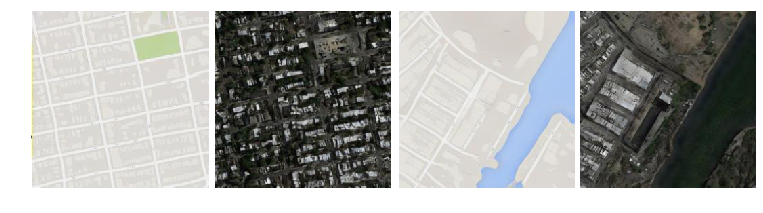

In [0]:
plt.figure(figsize=(13,10))
plt.imshow(plt.imread('CycleGAN/imgs/terrain-generation.png'))
plt.axis('off')


## Character/Hero Generation

We experimented with an image collection of Pokemon and another image collection of 8-bit low resolution heros.  By applying the encoder model on the low resolution collection, we expect to get high resolution, Pokemon-esque images.  For the reverse process, we expect to turn our Pokemon images into 8-bit renderings.  Of course this is simple enough to do without Deep Learning, so the first process is the more interesting one.  Interestingly, the colors tend to completely change.  Though, there are likely some extensions to the loss that we could add to help enforce that colors stay more constant, and these have been explored in the literature.

(-0.5, 1207.5, 643.5, -0.5)

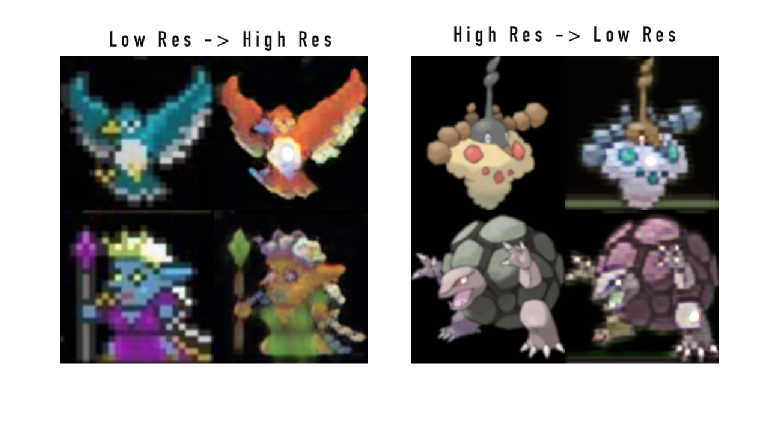

In [0]:
plt.figure(figsize=(13,10))
plt.imshow(plt.imread('CycleGAN/imgs/character-generation.png'))
plt.axis('off')

## Plenty More

The authors of the CycleGAN paper offer plenty more ideas on their GitHub along with their own implementation of CycleGAN using Torch and Pytorch: [https://junyanz.github.io/CycleGAN/](https://junyanz.github.io/CycleGAN/)

# Conclusion

Was this useful or did you make something awesome with CycleGAN?  Share it with me at https://twitter.com/pkmital - I'd love to hear!

Also, if you are interested in learning more about these networks and related techniques, including Seq2Seq, DRAW, MDN, WaveNet, and plenty more at https://www.kadenze.com/programs/creative-applications-of-deep-learning-with-tensorflow